## MINERvA's Boosted Decision Tree Neutrino MC Events Reweight with GENIE and NUISANCE Flat Tree
This note book demonstrates a reweight analysis using MINERvA's GENIE medium energy numu-carbon MC events. 

In [1]:
import sys
# Change this path to your working directory where BDTReweight is installed:
sys.path.append('/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/')

from BDTReweight.analysis import transform_momentum_to_reaction_frame, create_dataframe_from_nuisance, draw_source_target_distributions_and_ratio
from BDTReweight.nuisance_flat_tree import NuisanceFlatTree
from BDTReweight.reweighter import Reweighter
from BDTReweight.utilities import particle_variable_to_latex, diff_xsec_latex_wrt_variable
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import time

### MINERvA's ME numu-carbon CCQE-like 1mu1p0n reweight demo
- Source generator: GENIE v2.12.6
- Target generator: GENIE v3.04.00 tune AR23_20i_00_000

This notebook uses GENIE MC sample NUISANCE flat tree root files stored on MINERvA GPVM.

Prepare trees from MC samples for training:

In [2]:
# set train / test size: total events
size = 1000000
# prepare source sample NuisanceFlatTree for training
tree_source_train = NuisanceFlatTree(
    # GENIE v2.12.6 sample (prepared by Dan Ruterbories):
    '/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v2_12_6/tracker/minervabase/Flattened_GENIE_v2_12_6_DefaultMEC_numu_CH_100_ghep.root',
    entry_start=0, entry_stop=size
    # ['/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v2_12_6/tracker/minervabase/Flattened_GENIE_v2_12_6_DefaultMEC_numu_CH_100_ghep.root',
    # '/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v2_12_6/tracker/minervabase/Flattened_GENIE_v2_12_6_DefaultMEC_numu_CH_101_ghep.root',
    # '/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v2_12_6/tracker/minervabase/Flattened_GENIE_v2_12_6_DefaultMEC_numu_CH_102_ghep.root',
    # '/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v2_12_6/tracker/minervabase/Flattened_GENIE_v2_12_6_DefaultMEC_numu_CH_103_ghep.root'],
)
# GENIE v2 CCQE-like final state has these particles: muon, proton, neutron, 25 MeV binding energy place holder
# Their pdg: 13, 2212, 2112, 2000000101
# GENIE v3 doesn't have this place holder.
mask_CCQELike = (tree_source_train.get_mask_final_state_allowed_pdg([13, 2212, 2112, 2000000101])
        & (tree_source_train._flattree_vars['tgta']==12)
        & tree_source_train.get_mask_topology({'proton':'>=1'}))
tree_source_train.update_tree_with_mask(mask_CCQELike)
tree_source_train._flattree_vars['dpt'] = tree_source_train._flattree_vars['dpt'] / 1000

# prepare target sample NuisanceFlatTree for training
tree_target_train = NuisanceFlatTree(
    # GENEIE v3.04.00 AR23 sample:
    '/exp/minerva/data/users/zihaolin/MC_outputs/GENIE/GENIEv3_AR23_MINERvA_ME_FHC_numu_C12_NUISFLAT.root',
    entry_start=0, entry_stop=size
    # ['/exp/minerva/data/users/zihaolin/MC_outputs/GENIE/GENIEv3_AR23_MINERvA_ME_FHC_numu_C12_500_NUISFLAT.root',
    # '/exp/minerva/data/users/zihaolin/MC_outputs/GENIE/GENIEv3_AR23_MINERvA_ME_FHC_numu_C12_501_NUISFLAT.root',
    # '/exp/minerva/data/users/zihaolin/MC_outputs/GENIE/GENIEv3_AR23_MINERvA_ME_FHC_numu_C12_502_NUISFLAT.root',
    # '/exp/minerva/data/users/zihaolin/MC_outputs/GENIE/GENIEv3_AR23_MINERvA_ME_FHC_numu_C12_503_NUISFLAT.root'],
    # Alternatively, try GENIE v3 G18_10a:
    # '/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v3_0_6/tracker/G18_10a_02_11a/CH/flat_GENIE_G18_10a_02_11a_50M.root',
    # Use akward array's kwargs to control sample size
)
mask_CCQELike = (tree_target_train.get_mask_final_state_allowed_pdg([13, 2212, 2112])
        & (tree_target_train._flattree_vars['tgta']==12)
        & tree_target_train.get_mask_topology({'proton':'>=1'}))
tree_target_train.update_tree_with_mask(mask_CCQELike)
tree_target_train._flattree_vars['dpt'] = tree_target_train._flattree_vars['dpt'] / 1000


# prepare source sample NuisanceFlatTree for testing
tree_source_test = NuisanceFlatTree(
    # Statistically independent GENIE v2.12.6 sample (prepared by Dan Ruterbories):
    '/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v2_12_6/tracker/minervabase/Flattened_GENIE_v2_12_6_DefaultMEC_numu_CH_101_ghep.root',
    entry_start=0, entry_stop=size
    # ['/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v2_12_6/tracker/minervabase/Flattened_GENIE_v2_12_6_DefaultMEC_numu_CH_104_ghep.root',
    # '/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v2_12_6/tracker/minervabase/Flattened_GENIE_v2_12_6_DefaultMEC_numu_CH_105_ghep.root',
    # '/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v2_12_6/tracker/minervabase/Flattened_GENIE_v2_12_6_DefaultMEC_numu_CH_106_ghep.root',
    # '/pnfs/minerva/persistent/Models/GENIE/Medium_Energy/FHC/v2_12_6/tracker/minervabase/Flattened_GENIE_v2_12_6_DefaultMEC_numu_CH_107_ghep.root'],
)
mask_CCQELike = (tree_source_test.get_mask_final_state_allowed_pdg([13, 2212, 2112, 2000000101])
        & (tree_source_test._flattree_vars['tgta']==12)
        & tree_source_test.get_mask_topology({'proton':'>=1'}))
tree_source_test.update_tree_with_mask(mask_CCQELike)
tree_source_test._flattree_vars['dpt'] = tree_source_test._flattree_vars['dpt'] / 1000


# prepare target sample NuisanceFlatTree for testing
tree_target_test = NuisanceFlatTree(
    # A GENEIE v3.04.00 AR23 sample:
    '/exp/minerva/data/users/zihaolin/MC_outputs/GENIE/GENIEv3_AR23_MINERvA_ME_FHC_numu_C12_NUISFLAT.root',
    entry_start=size, entry_stop=size*2
)
mask_CCQELike = (tree_target_test.get_mask_final_state_allowed_pdg([13, 2212, 2112])
        & (tree_target_test._flattree_vars['tgta']==12)
        & tree_target_test.get_mask_topology({'proton':'>=1'}))
tree_target_test.update_tree_with_mask(mask_CCQELike)
tree_target_test._flattree_vars['dpt'] = tree_target_test._flattree_vars['dpt'] / 1000


# Set conversion factor from event rate to cross-section:
# The GENIEv2 sample has 1M events; the AR23 sample has 4M events. Need to scale up the fScaleFactor.
scale_source_test = tree_source_test.get_conversion_factor_eventrate_to_xsec() * 1000000 / size
scale_target_test = tree_target_test.get_conversion_factor_eventrate_to_xsec() * 4000000 / size
# scale_source_test = tree_source_test.get_conversion_factor_eventrate_to_xsec()
# scale_target_test = tree_target_test.get_conversion_factor_eventrate_to_xsec()


### GENIE v2's elastic FSI bug events
Needs to pay extra attention to the elastic FSI bug in GENIE v2: 
the elastic FSI fate protons can change angle unphysically, so these events will be dropped.

$cos(\theta)$ for angle $\theta$ between vertex and final state proton momentum is checked to filter these events.

In [3]:
# Drop FSI bug events for GENIE v2 train and test sets
indices_good_FSI = tree_source_train.get_indices_genie2_drop_fsibug_events()
tree_source_train.update_tree_with_mask(indices_good_FSI)

indices_good_FSI = tree_source_test.get_indices_genie2_drop_fsibug_events()
tree_source_test.update_tree_with_mask(indices_good_FSI)

### CCQE-like final state topologies
The nucleon contents of CCQE-like final sate topologies can be divided into these categories:
* 0p0n
* 0pNn
* 1p0n
* 1pNn
* 2p0n
* 2pNn
* others ($\ge 3$ protons)

where we set kinetic energy detecting threshold to be 50 MeV and 10 MeV for proton and neutron, and $N\ge1$.
These categories have different training variables and will be reweighted seperately.

See more at <arXiv:2510.07463> Table I and the discussions there.

In [120]:
# Specify detecting thresholds and topology particle counts:
KE_thresholds={'proton':0.05, 'neutron':0.01}

# Create dictionaries to store dataframes later:
source_train = {}
target_train = {}
source_test = {}
target_test = {}

# Legends of source, source reweighted, and target to be labeled on plot:
legends = ['GENIE v2.12.6 ($v2$)', 'GENIE v2.12.6 reweighted ($v2\'$)', 'GENIE v3.0.6 AR23 ($v3$)']

# Record a normalization factor
normalizations = {}

### CCQE-like 1 $\mu$ 0p0n:

In [121]:
# Category name:
category = '0p0n'

# Specify particle counts in final state:
particle_counts = {'muon':'==1', 'proton':'==0', 'neutron':'==0'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
]

# Specify reweight training variables:
reweight_variables=['total_proton_px','total_proton_py','total_proton_pz','total_proton_KE','leading_muon_py','leading_muon_pz']

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['total_proton']

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 3.090 sec


/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:221: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


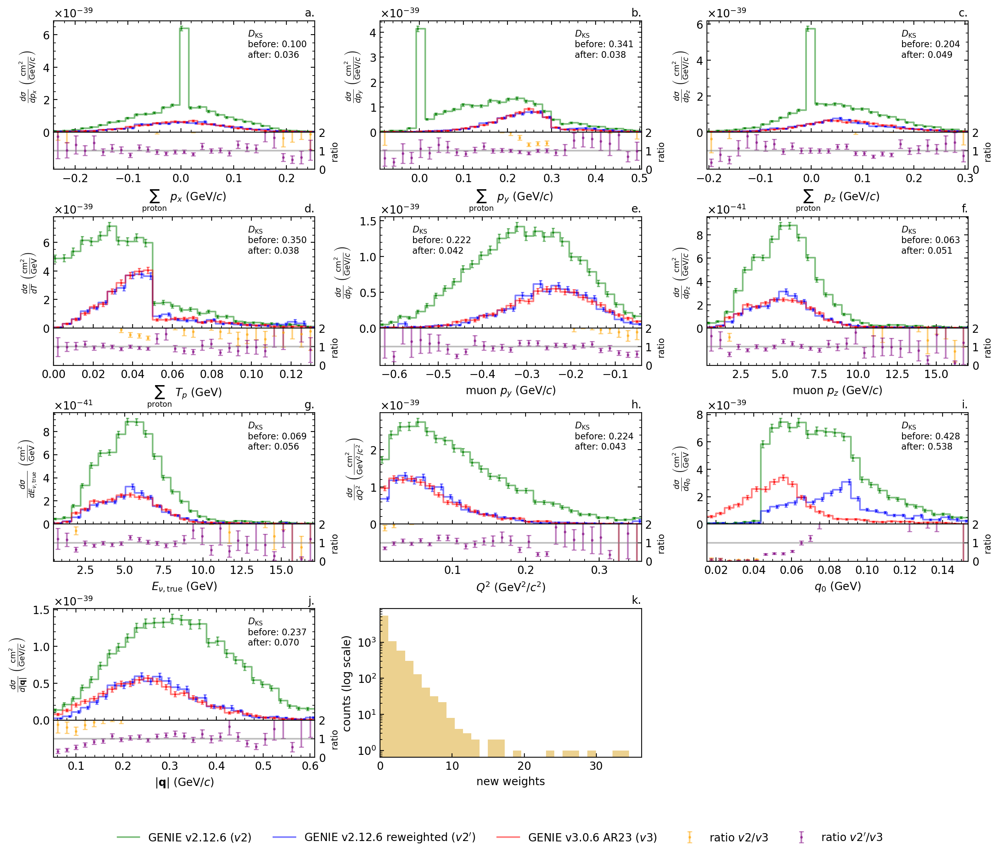

In [122]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = ['total_proton_px','total_proton_py','total_proton_pz','total_proton_KE','leading_muon_py','leading_muon_pz', 
                     'Enu_true', 'Q2', 'q0', 'q3', 
                     'weight']

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables, legends=legends,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# Save reweighter to a path:
reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


In [123]:
total_w = reweighter.predict_weights(source_train[category][reweight_variables])
print('source train:', len(source_train[category]), 'target train:', len(target_train[category]),
      'total source_w:', np.sum(total_w))
ratio = len(target_train[category])/np.sum(total_w)
print('ratio:', ratio)
normalizations[category] = ratio

source train: 7602 target train: 2489 total source_w: 3741.062397287581
ratio: 0.6653190285745098


### CCQE-like 1 $\mu$ 0pNn:

In [124]:
# Category name:
category = '0pNn'

# Specify particle counts in final state:
particle_counts = {'muon':'==1', 'proton':'==0', 'neutron':'>=1'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'leading_neutron_px', 'leading_neutron_py', 'leading_neutron_pz', 'leading_neutron_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
]

# Specify reweight training variables:
reweight_variables = [
    'leading_neutron_px', 'leading_neutron_py', 'leading_neutron_pz',
    'total_proton_px','total_proton_py','total_proton_pz',
    'total_proton_KE','leading_muon_py','leading_muon_pz'
]

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['leading_neutron','total_proton']

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 7.488 sec


/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:221: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


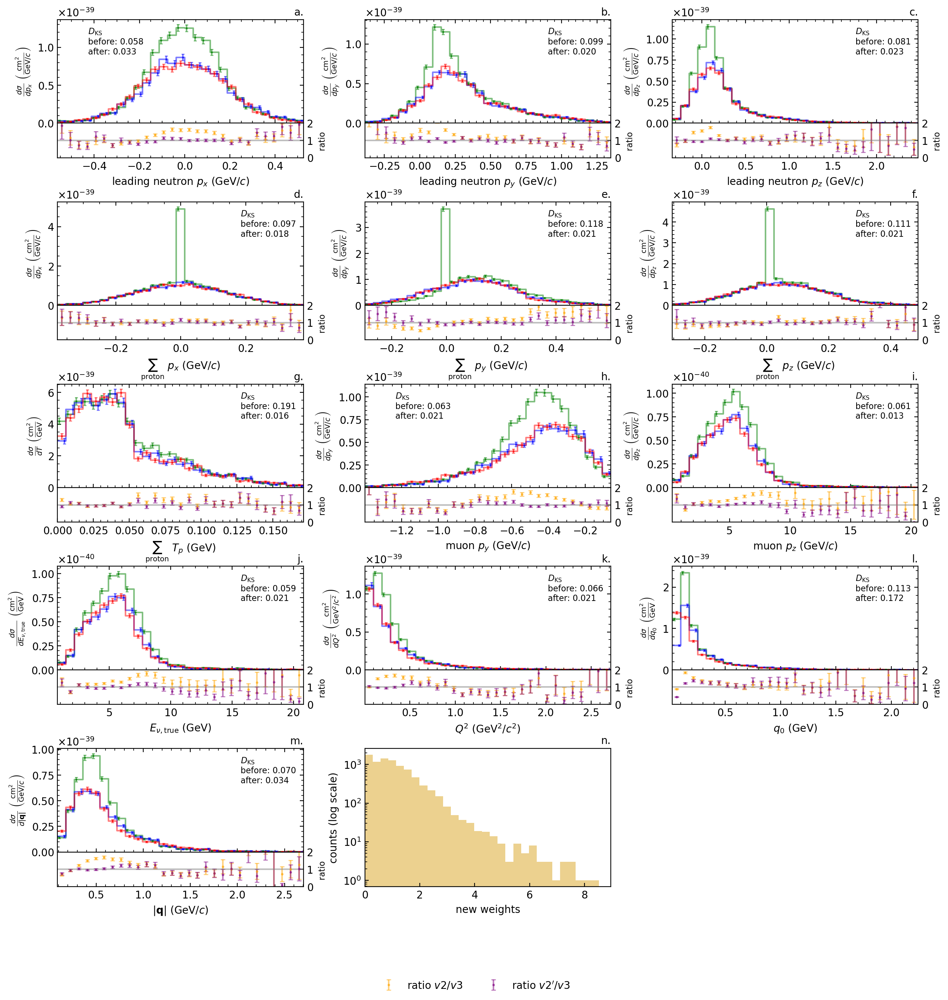

In [125]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = [
    'leading_neutron_px', 'leading_neutron_py', 'leading_neutron_pz',
    'total_proton_px','total_proton_py','total_proton_pz',
    'total_proton_KE','leading_muon_py','leading_muon_pz', 
    'Enu_true', 'Q2', 'q0', 'q3', 
    
    'weight'
]

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# Save reweighter to a path:
reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


In [126]:
total_w = reweighter.predict_weights(source_train[category][reweight_variables])
print('source train:', len(source_train[category]), 'target train:', len(target_train[category]),
      'total source_w:', np.sum(total_w))
ratio = len(target_train[category])/np.sum(total_w)
print('ratio:', ratio)
normalizations[category] = ratio

source train: 8809 target train: 6544 total source_w: 6301.763010605337
ratio: 1.0384395587372928


### CCQE-like 1 $\mu$ 1p0n:

In [147]:
# Category name:
category = '1p0n'

# Specify particle counts in final state:
particle_counts = {'muon':'==1', 'proton':'==1', 'neutron':'==0'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'dpt', 'dalphat', 'dphit',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz', 'leading_proton_KE',
]

# Specify reweight training variables:
reweight_variables=['leading_proton_px','leading_proton_py','leading_proton_pz','total_proton_KE','leading_muon_py','leading_muon_pz']

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['leading_proton','total_proton']

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
# reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})
# reweighter = Reweighter(n_estimators=30, learning_rate=0.1, max_depth=30, min_samples_leaf=30, gb_args={'subsample': 1.0})
reweighter = Reweighter(n_estimators=20,learning_rate=0.1, max_depth=30,min_samples_leaf=30, gb_args={'subsample': 1.0})


# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 19.091 sec


/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:221: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


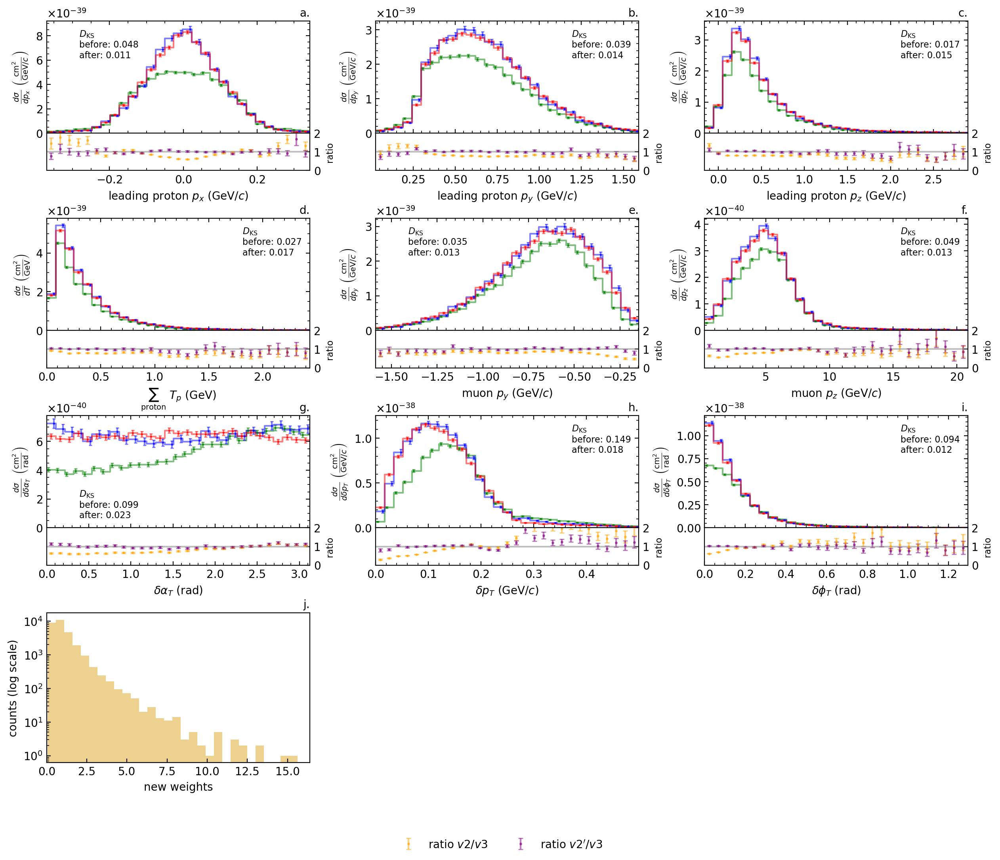

In [148]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = [
    'leading_proton_px','leading_proton_py','leading_proton_pz',
    'total_proton_KE','leading_muon_py','leading_muon_pz', 
    # 'total_proton_px','total_proton_py','total_proton_pz', 
    'dalphat', 'dpt', 'dphit', 
    # 'Enu_true', 'Q2', 'q0', 'q3', 
    'weight'
]

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)
# # Draw distribution histograms:
# draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
#     variables = drawing_variables,
#     source_weights = np.ones(len(source_test[category])),
#     target_weights = np.ones(len(target_test[category])), 
#     new_source_weights = source_test[category]['weight'],
#     xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
#     ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
#     scale_source = scale_source_test, scale_target = scale_target_test
# )



mask = source_test[category]['weight'] < 20
# source_test[category]['weight'] = source_test[category]['weight'] * len(target_test[category])/np.sum(source_test[category]['weight'] )
draw_source_target_distributions_and_ratio(source_test[category][mask], target_test[category], 
    variables = drawing_variables,
    source_weights = np.ones(len(source_test[category][mask])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'][mask],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# Save reweighter to a path:
reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


In [129]:
total_w = reweighter.predict_weights(source_train[category][reweight_variables])
print('source train:', len(source_train[category]), 'target train:', len(target_train[category]),
      'total source_w:', np.sum(total_w))
ratio = len(target_train[category])/np.sum(total_w)
print('ratio:', ratio)
normalizations[category] = ratio

source train: 28660 target train: 35577 total source_w: 18209.27692186086
ratio: 1.9537843349116513


### CCQE-like 1 $\mu$ 1pNn:

In [130]:
# Category name:
category = '1pNn'

# Specify particle counts in final state:
particle_counts = {'muon':'==1', 'proton':'==1', 'neutron':'>=1'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'dalphat', 'dpt', 'dphit',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz', 'leading_proton_KE',
    'leading_neutron_px', 'leading_neutron_py', 'leading_neutron_pz', 'leading_neutron_KE',
]

# Specify reweight training variables:
reweight_variables=['leading_proton_px','leading_proton_py','leading_proton_pz','total_proton_KE',
    'leading_muon_py','leading_muon_pz', 'leading_neutron_px', 'leading_neutron_py', 'leading_neutron_pz',]

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['leading_proton','leading_neutron','total_proton']

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 18.569 sec


/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:221: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


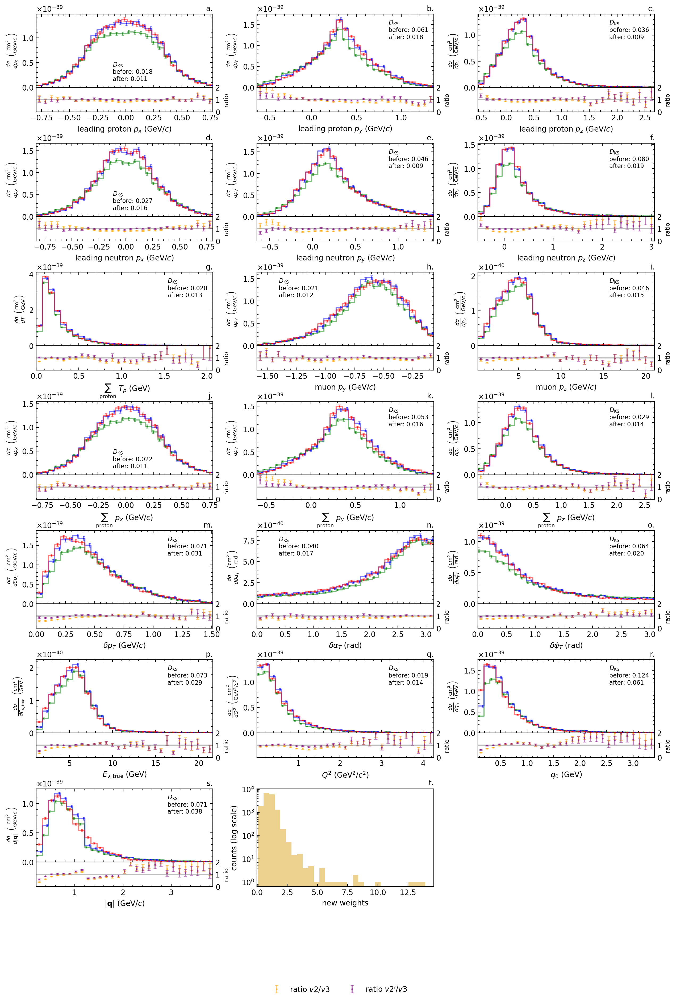

In [131]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = [
    'leading_proton_px','leading_proton_py','leading_proton_pz',
    'leading_neutron_px','leading_neutron_py','leading_neutron_pz',
    'total_proton_KE','leading_muon_py','leading_muon_pz',
    'total_proton_px','total_proton_py','total_proton_pz',
    'dpt', 'dalphat', 'dphit',
    'Enu_true', 'Q2', 'q0', 'q3', 
    'weight'
]

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# Save reweighter to a path:
reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


In [132]:
total_w = reweighter.predict_weights(source_train[category][reweight_variables])
print('source train:', len(source_train[category]), 'target train:', len(target_train[category]),
      'total source_w:', np.sum(total_w))
ratio = len(target_train[category])/np.sum(total_w)
print('ratio:', ratio)
normalizations[category] = ratio

source train: 16265 target train: 18121 total source_w: 14904.294622117217
ratio: 1.21582406007389


### CCQE-like 1 $\mu$ 2p0n:

In [133]:
# Category name:
category = '2p0n'

# Specify particle counts in final state:
particle_counts = {'muon':'==1', 'proton':'==2', 'neutron':'==0'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'dalphat', 'dpt', 'dphit',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz', 'leading_proton_KE',
    'subleading_proton_px', 'subleading_proton_py', 'subleading_proton_pz', 'subleading_proton_KE'
]

# Specify reweight training variables:
reweight_variables=['leading_proton_px','leading_proton_py','leading_proton_pz','total_proton_KE',
    'leading_muon_py','leading_muon_pz', 'subleading_proton_px', 'subleading_proton_py', 'subleading_proton_pz',]

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['leading_proton','subleading_proton','total_proton']

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
reweighter = Reweighter(n_estimators=30, learning_rate=0.1, max_depth=3, min_samples_leaf=30, gb_args={'subsample': 1.0})
# reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 2.134 sec


/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:221: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


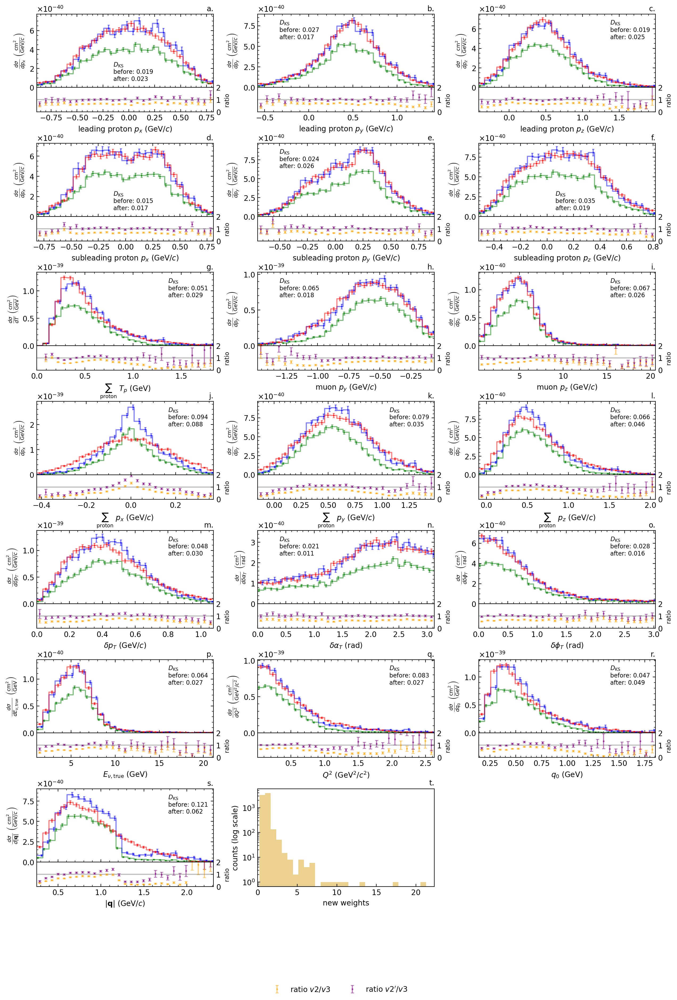

In [134]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = [
    'leading_proton_px','leading_proton_py','leading_proton_pz',
    'subleading_proton_px','subleading_proton_py','subleading_proton_pz',
    'total_proton_KE','leading_muon_py','leading_muon_pz', 
    'total_proton_px','total_proton_py','total_proton_pz', 
    'dpt', 'dalphat', 'dphit',
    'Enu_true', 'Q2', 'q0', 'q3',
    'weight'
]

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# Save reweighter to a path:
reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


In [135]:
total_w = reweighter.predict_weights(source_train[category][reweight_variables])
print('source train:', len(source_train[category]), 'target train:', len(target_train[category]),
      'total source_w:', np.sum(total_w))
ratio = len(target_train[category])/np.sum(total_w)
print('ratio:', ratio)
normalizations[category] = ratio

source train: 7343 target train: 11208 total source_w: 6634.648876851901
ratio: 1.6893132112996045


### CCQE-like 1 $\mu$ 2pNn:

In [136]:
# Category name:
category = '2pNn'

# Specify particle counts in final state:
particle_counts = {'muon':'==1', 'proton':'==2', 'neutron':'>=1'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'dalphat', 'dpt', 'dphit',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz', 'leading_proton_KE',
    'subleading_proton_px', 'subleading_proton_py', 'subleading_proton_pz', 'subleading_proton_KE',
    'leading_neutron_px', 'leading_neutron_py', 'leading_neutron_pz', 'leading_neutron_KE'
]

# Specify reweight training variables:
reweight_variables=['leading_proton_px','leading_proton_py','leading_proton_pz','total_proton_KE',
    'leading_neutron_px', 'leading_neutron_py', 'leading_neutron_pz',
    'leading_muon_py','leading_muon_pz', 'subleading_proton_px', 'subleading_proton_py', 'subleading_proton_pz',]

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['leading_proton','subleading_proton','leading_neutron','total_proton']

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 16.791 sec


/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:221: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


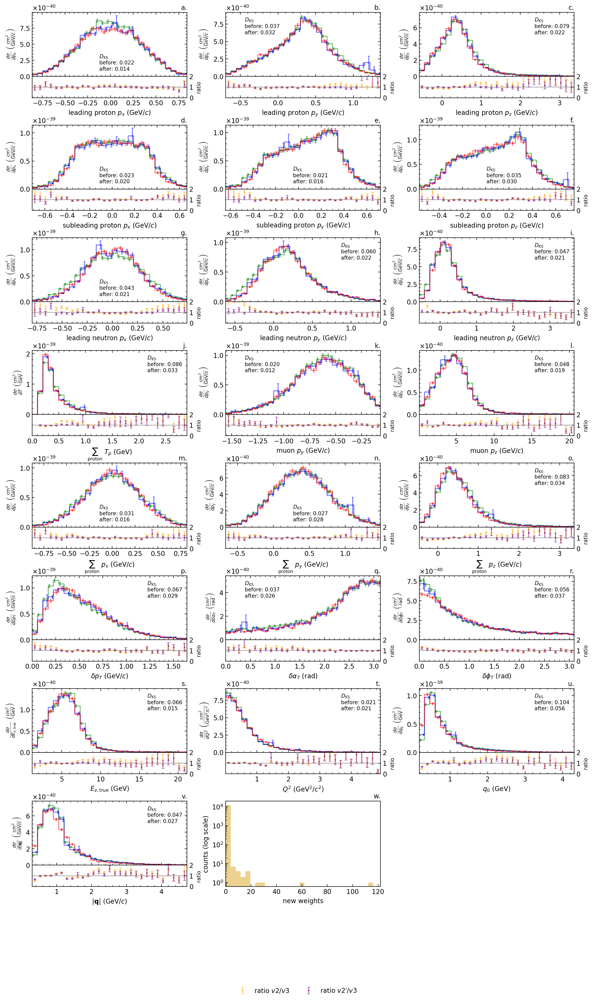

In [137]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = [
    'leading_proton_px','leading_proton_py','leading_proton_pz',
    'subleading_proton_px','subleading_proton_py','subleading_proton_pz',
    'leading_neutron_px', 'leading_neutron_py', 'leading_neutron_pz',
    'total_proton_KE','leading_muon_py','leading_muon_pz',
    'total_proton_px','total_proton_py','total_proton_pz',
    'dpt', 'dalphat', 'dphit',
    'Enu_true', 'Q2', 'q0', 'q3', 
    'weight'
]

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# Save reweighter to a path:
reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


In [138]:
total_w = reweighter.predict_weights(source_train[category][reweight_variables])
print('source train:', len(source_train[category]), 'target train:', len(target_train[category]),
      'total source_w:', np.sum(total_w))
ratio = len(target_train[category])/np.sum(total_w)
print('ratio:', ratio)
normalizations[category] = ratio

source train: 12526 target train: 11935 total source_w: 11019.062546800136
ratio: 1.0831229924786883


### CCQE-like 1 $\mu$ others ($\ge$ 3 protons):

In [139]:
# Category name:
category = 'others'

# Specify particle counts in final state:
particle_counts = {'muon':'==1', 'proton':'>=3'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'dalphat', 'dpt', 'dphit',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz', 'leading_proton_KE',
]

# Specify reweight training variables:
reweight_variables=['leading_proton_px','leading_proton_py','leading_proton_pz','total_proton_KE',
    'leading_muon_py','leading_muon_pz']

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['leading_proton','total_proton']

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')



Elapsed time: 12.250 sec


/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:221: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


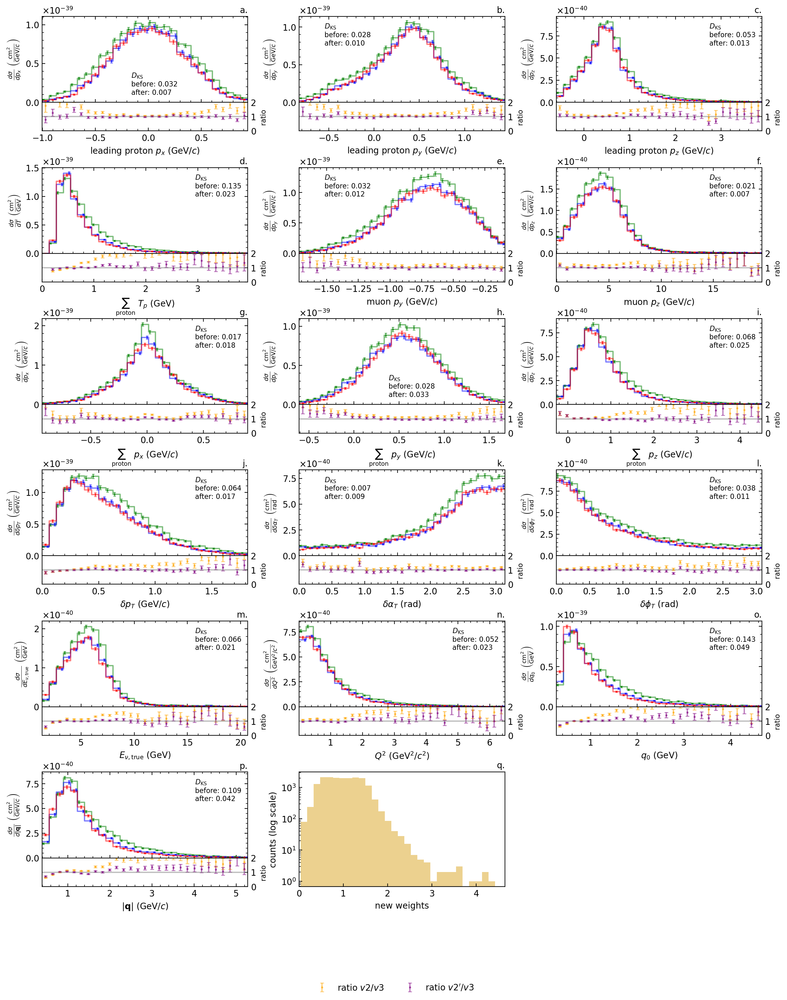

In [140]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = [
    'leading_proton_px','leading_proton_py','leading_proton_pz',
    'total_proton_KE','leading_muon_py','leading_muon_pz', 
    'total_proton_px','total_proton_py','total_proton_pz', 
    'dpt', 'dalphat', 'dphit',
    'Enu_true', 'Q2', 'q0', 'q3',
    'weight'
]

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# Save reweighter to a path:
reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


In [141]:
total_w = reweighter.predict_weights(source_train[category][reweight_variables])
print('source train:', len(source_train[category]), 'target train:', len(target_train[category]),
      'total source_w:', np.sum(total_w))
ratio = len(target_train[category])/np.sum(total_w)
print('ratio:', ratio)
normalizations[category] = ratio

source train: 17677 target train: 15142 total source_w: 16319.56713028845
ratio: 0.927843237453098


### Save or load Reweighter via Python pickle

In [142]:
# # Save to a path:
# reweighter.save_to_pickle('/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu1p0n.pkl')

# # Load from path:
# reweighter = Reweighter.load_from_pickle('/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu1p0n.pkl')

print(normalizations)

with open('/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/CCQELike_MINERvA_GENIEv2_to_v3AR23_topology_normalizations.txt', 'w') as f:
    for norm in normalizations.values():
        f.write(f"{norm}\n")

{'0p0n': 0.6653190285745098, '0pNn': 1.0384395587372928, '1p0n': 1.9537843349116513, '1pNn': 1.21582406007389, '2p0n': 1.6893132112996045, '2pNn': 1.0831229924786883, 'others': 0.927843237453098}


### Combine categories with $\ge$ 1 proton(s) above KE threshold

/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:221: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


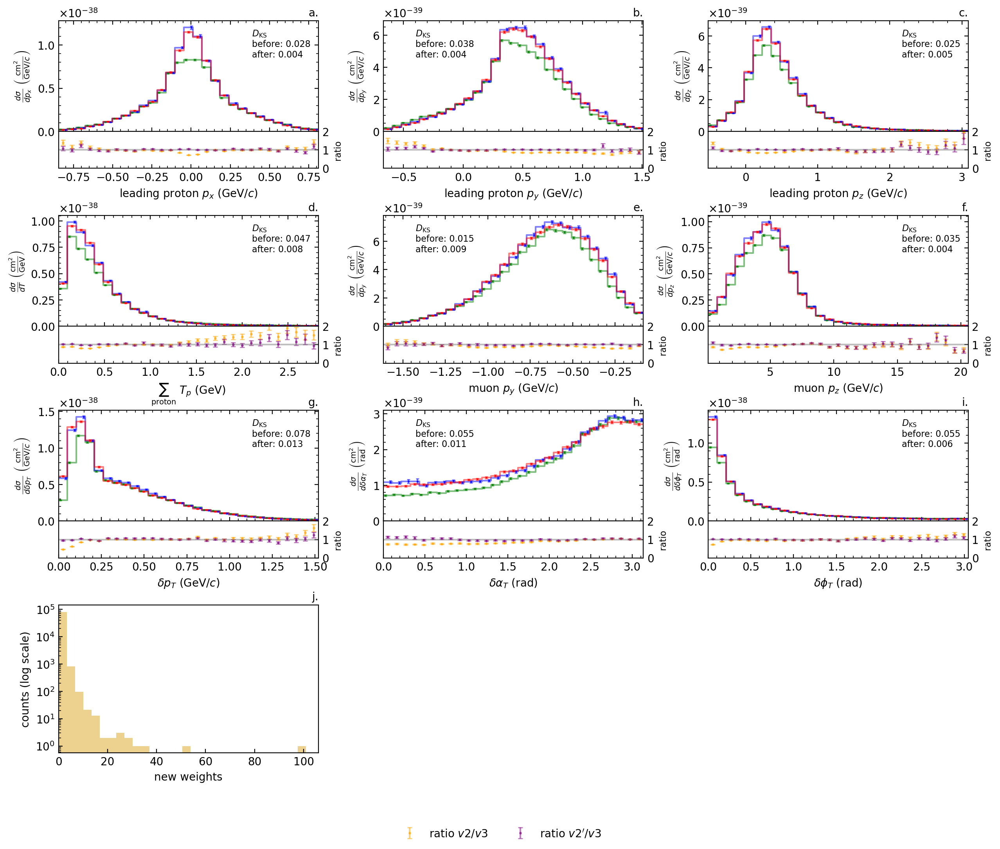

In [146]:
# Category'1p0n', '1pNn', '2p0n', '2pNn', 'others':
drawing_variables = [
    'leading_proton_px','leading_proton_py','leading_proton_pz',
    'total_proton_KE','leading_muon_py','leading_muon_pz', 
    # 'total_proton_px','total_proton_py','total_proton_pz', 
    'dpt', 'dalphat', 'dphit', 
    # 'Enu_true', 'Q2', 'q0', 'q3', 
    'weight'
]

source_test_leading_proton = pd.concat([
        source_test['1p0n'][drawing_variables], source_test['1pNn'][drawing_variables], source_test['2p0n'][drawing_variables],
        source_test['2pNn'][drawing_variables], source_test['others'][drawing_variables]
])

target_test_leading_proton = pd.concat([
        target_test['1p0n'][drawing_variables], target_test['1pNn'][drawing_variables], target_test['2p0n'][drawing_variables],
        target_test['2pNn'][drawing_variables], target_test['others'][drawing_variables]
])


# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test_leading_proton, target_test_leading_proton, 
    variables = drawing_variables,
    source_weights = np.ones(len(source_test_leading_proton)),
    target_weights = np.ones(len(target_test_leading_proton)), 
    new_source_weights = source_test_leading_proton['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)


### Combine all categories

/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:221: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


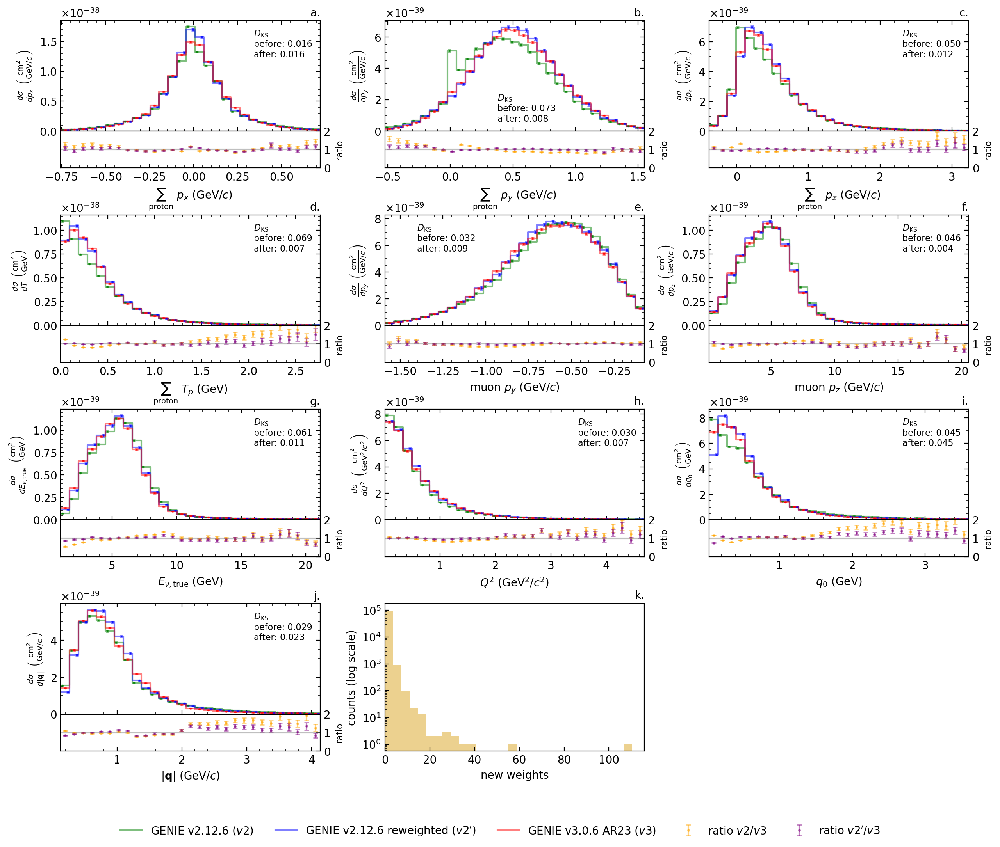

In [144]:
# All categories.
drawing_variables = [
    'total_proton_px','total_proton_py','total_proton_pz', 
    'total_proton_KE','leading_muon_py','leading_muon_pz',
    'Enu_true', 'Q2', 'q0', 'q3', 
    'weight'
]

source_test_all = pd.concat([
        source_test['0p0n'][drawing_variables], source_test['0pNn'][drawing_variables],
        source_test['1p0n'][drawing_variables], source_test['1pNn'][drawing_variables], source_test['2p0n'][drawing_variables],
        source_test['2pNn'][drawing_variables], source_test['others'][drawing_variables]
])

target_test_all = pd.concat([
        target_test['0p0n'][drawing_variables], target_test['0pNn'][drawing_variables],
        target_test['1p0n'][drawing_variables], target_test['1pNn'][drawing_variables], target_test['2p0n'][drawing_variables],
        target_test['2pNn'][drawing_variables], target_test['others'][drawing_variables]
])


# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test_all, target_test_all, 
    variables = drawing_variables,legends = legends,
    source_weights = np.ones(len(source_test_all)),
    target_weights = np.ones(len(target_test_all)), 
    new_source_weights = source_test_all['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)


### Efficiency toy model

In [145]:
from BDTReweight.analysis import draw_2Dxsec_and_efficiency
from BDTReweight.utilities import efficiency, cosine_theta_vectors, normalize_vectors
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from matplotlib.colors import LinearSegmentedColormap


In [50]:
proton_P = source_test_leading_proton[['leading_proton_px', 'leading_proton_py', 'leading_proton_pz']].values
neutrino_dir = np.zeros(shape=proton_P.shape)
neutrino_dir[:,2] = 1
source_test_leading_proton['cosT'] = cosine_theta_vectors(proton_P, neutrino_dir)
source_test_leading_proton['leading_proton_angle'] = np.arccos(source_test_leading_proton['cosT'])
source_test_leading_proton['Tp'] = np.linalg.norm(proton_P, axis=1)

proton_P = target_test_leading_proton[['leading_proton_px', 'leading_proton_py', 'leading_proton_pz']].values
neutrino_dir = np.zeros(shape=proton_P.shape)
neutrino_dir[:,2] = 1
target_test_leading_proton['cosT'] = cosine_theta_vectors(proton_P, neutrino_dir)
target_test_leading_proton['leading_proton_angle'] = np.arccos(target_test_leading_proton['cosT'])
target_test_leading_proton['Tp'] = np.linalg.norm(proton_P, axis=1)


In [56]:
source_test_leading_proton['eff']=efficiency(source_test_leading_proton['cosT'], source_test_leading_proton['Tp'])
target_test_leading_proton['eff']=efficiency(target_test_leading_proton['cosT'], target_test_leading_proton['Tp'])


In [72]:
def MNEff_evaluate(df = None, xybins = (np.linspace(0,0.6,20),np.linspace(0,2,20)), reweight=False, Xsec_columns=('dpt','pT_muon')):

    if 'pT_muon' not in df.columns:
        df['pT_muon'] = - df['leading_muon_py']
    xcol, ycol = Xsec_columns
    N, dpt_edges, pT_edges = np.histogram2d(df[xcol],df[ycol],bins=xybins,weights=df['weight'])
    N = np.zeros(N.shape)
    Nerr = np.zeros(N.shape)
    M = np.zeros(N.shape)
    Merr = np.zeros(N.shape)
    K = np.zeros(N.shape)
    R = np.zeros(N.shape)
    Rerr = np.zeros(N.shape)
    for i in range(len(dpt_edges)-1):
        for j in range(len(pT_edges)-1):
            df_bin = df.loc[(df[xcol]>=dpt_edges[i])&(df[xcol]<dpt_edges[i+1])
                &(df[ycol]>=pT_edges[j])&(df[ycol]<pT_edges[j+1])].copy()
            if reweight == False:
                df_bin = df_bin.copy()
                df_bin['weight'] = 1.0
                
            N[i,j] = df_bin['weight'].sum()

            Nerr[i,j] = np.sqrt((df_bin['weight']**2).sum())
            M[i,j] = (df_bin['eff']*df_bin['weight']).sum()
            Merr[i,j] = np.sqrt((( df_bin['eff'] * df_bin['weight'] )**2).sum())

            K[i,j] = len(df_bin)

            R[i,j] = M[i,j]/N[i,j]
            cov = np.sum(df_bin['eff']*df_bin['weight']**2)

            Rerr[i,j] = R[i,j]*np.sqrt(
                (Nerr[i,j]/N[i,j])**2
                +(Merr[i,j]/M[i,j])**2
                -2*cov/(N[i,j]*M[i,j])
            )

    return M, N, R, dpt_edges, pT_edges, Nerr, Merr, Rerr


def draw_2Dxsec_and_efficiency(df_genie2=[],df_genie3=[],xybins=(np.linspace(0,0.6,20),np.linspace(0,2,20)),fScale_genie2=scale_source_test,fScale_genie3=scale_target_test,
               Xsec_columns=('dpt','pT_muon'), xylabels=('$\delta p_T \ (\\text{GeV}/c)$','$p^\mu_T \ (\\text{GeV}/c)$')):
    M2, N2, eff2, xedges, yedges, N2err, M2err, R2err = MNEff_evaluate(df=df_genie2,xybins=xybins,reweight=False,Xsec_columns=Xsec_columns)
    M2_rwt, N2_rwt, eff2_rwt, _, _, N2rwt_err, M2rwt_err, R2rwt_err = MNEff_evaluate(df=df_genie2, reweight=True,xybins=xybins,Xsec_columns=Xsec_columns)
    M3, N3, eff3, _, _, N3err, M3err, R3err = MNEff_evaluate(df=df_genie3,xybins=xybins,reweight=False,Xsec_columns=Xsec_columns)
    datas = [N2, M2, eff2, N3, M3, eff3, N2_rwt, M2_rwt, eff2_rwt]
    titles = ['$N_{v2}$',
              '$M_{v2}$',
              '$\phi_{v2}=M_{v2}/N_{v2}$',
               '$N_{v3}$', 
               '$M_{v3}$', 
               '$\phi_{v3}=M_{v3}/N_{v3}$', 
               '$N_{v2}\'$', 
               '$M_{v2}\'$', 
               '$\phi_{v2}\'=M_{v2}\'/N_{v2}\'$'
        ]
    xlabel, ylabel = xylabels
    fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(16, 14),dpi=300)  # 3x3 grid
    vmax = 1.9e-38
    for i, (ax, data, title) in enumerate(zip(axs.flat, datas, titles)):
        X, Y = np.meshgrid(xedges, yedges)
        area=(xedges[1]-xedges[0])*(yedges[1]-yedges[0])
        # cmap = LinearSegmentedColormap.from_list("black_white_red", ['black','white','red'], N=256)
        cmap = 'viridis'
        if i in [0,1]:
            mesh = ax.pcolormesh(X, Y, data.T*fScale_genie2/area, shading='auto', cmap=cmap, vmin=0.0,vmax=vmax)

        elif i in [3,4]:
            mesh = ax.pcolormesh(X, Y, data.T*fScale_genie3/area, shading='auto', cmap=cmap,vmin=0.0,vmax=vmax)
        elif i in [6,7]:
            # mesh = ax.pcolormesh(X, Y, data.T*(len(df_genie3)*fScale_genie3/len(df_genie2))/area, shading='auto', cmap='viridis')  # Transpose counts
            mesh = ax.pcolormesh(X, Y, data.T/area, shading='auto', cmap=cmap,vmin=0.0,vmax=vmax)
        else:
            mesh = ax.pcolormesh(X, Y, data.T, shading='auto', cmap=cmap,vmin=0.0,vmax=1.0) # efficiency plot

        cbar = plt.colorbar(mesh, ax=ax)
        if i in [0,1,3,4,6,7]:
            cbar.set_label('$\\frac{d^2\\sigma}{d\delta p_T d p^T_{\mu}} \ \left(\\frac{\\text{cm}^2}{(\\text{GeV}/c)^2}\\right)$')
        else:
            cbar.set_label('efficiency')

        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(f'{chr(ord("a")+i)}. '+title)
        ax.set_yticks(yedges)
        ax.set_yticklabels([f"{edge:.2f}" for edge in yedges])

        # plt.show()
    plt.tight_layout()
    # plt.show()
    
    
    

        
    datas = [eff2/eff3,eff2_rwt/eff3]
    titles = ['Ratio $\phi_{v2}/\phi_{v3}$','Ratio $\phi_{v2}\'/\phi_{v3}$']

    # vmin,vmax=(0.0, np.max([datas[0],datas[1]]))
    # vmin,vmax=(0.0, 3.0)
    vmin,vmax=(0.0, 2.0)


    print('vmin, vmax:',vmin,vmax)

        

    dpt_bin_centers = 0.5 * (xedges[:-1] + xedges[1:])
    # print('dpt bincenters:',dpt_bin_centers)
    eff23_ratio = eff2/eff3
    ratio23_err = eff23_ratio * np.sqrt((R2err/eff2)**2+(R3err/eff3)**2)

    
    # eff2_rwt/eff3 histogram slices
    eff2rwt3_ratio = eff2_rwt/eff3
    ratio2rwt3_err = eff2rwt3_ratio * np.sqrt((R2rwt_err/eff2_rwt)**2+(R3err/eff3)**2)



    # new: 2025 July 25 ______________________________________________________________________________________________________
    fig = plt.figure(figsize=(10, 8.5), dpi=300)
    outer = GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.07)

    # Top-left
    ax00 = fig.add_subplot(outer[0, 0])

    data=eff2/eff3
    X, Y = np.meshgrid(xedges, yedges)
    cmap = LinearSegmentedColormap.from_list("black_white_red", ['black','white','red'], N=256)
    # cmap = 'viridis'

    mesh = ax00.pcolormesh(X, Y, data.T, vmin=vmin, vmax=vmax, shading='auto', cmap=cmap)  # Transpose counts
    cbar = plt.colorbar(mesh, ax=ax00)
    cbar.set_ticks(np.linspace(vmin, vmax, 11))  # optional: set colorbar ticks at 0.0, 0.1, ..., 1.0
    # cbar.set_label('ratio')
    ax00.set_xlabel(xlabel)
    ax00.set_ylabel(ylabel)
    ax00.set_title(
        'a.',
        # 'a. Ratio $\phi_{v2}/\phi_{v3}$',
        fontsize=11)
    ax00.set_yticks(yedges)
    ax00.set_yticklabels([f"{edge:.2f}" for edge in yedges])

    # Top-right
    ax01 = fig.add_subplot(outer[0, 1])
    data=eff2_rwt/eff3
    X, Y = np.meshgrid(xedges, yedges)
    mesh = ax01.pcolormesh(X, Y, data.T, vmin=vmin, vmax=vmax, shading='auto', cmap=cmap)  # Transpose counts
    cbar = plt.colorbar(mesh, ax=ax01)
    cbar.set_ticks(np.linspace(vmin, vmax, 11))  # optional: set colorbar ticks at 0.0, 0.1, ..., 1.0
    # cbar.set_label('ratio')
    ax01.set_xlabel(xlabel)
    ax01.set_ylabel(ylabel)
    ax01.set_title(
        'b.',
        # 'b. Ratio $\phi_{v2}\'/\phi_{v3}$',
        fontsize=11)
    ax01.set_yticks(yedges)
    ax01.set_yticklabels([f"{edge:.2f}" for edge in yedges])



    half = eff2rwt3_ratio.shape[1]//2

    # Bottom-left: nested grid 
    inner = GridSpecFromSubplotSpec(eff2rwt3_ratio.shape[1]-half, 1, subplot_spec=outer[1, 0], hspace=0.05)
    for index in range(half,eff2rwt3_ratio.shape[1]):
        ax = fig.add_subplot(inner[index-half])
        i = eff2rwt3_ratio.shape[1]-1-index

        # draw a line at y=1
        ax.axhline(y=1, color='black', linestyle='--',alpha=0.5)
        # draw a invisible line to label "c." for paper...
        ax.axhline(y=0, color='black', linestyle='-',alpha=0.0,label='c.')


        # eff2_rwt/eff3
        slice_counts = eff2rwt3_ratio.T[i, :]
        errors = ratio2rwt3_err.T[i,:]

        slice_counts[np.isnan(slice_counts)] = 0
        ax.step(xedges, np.append(slice_counts, slice_counts[-1]), where='post',label='$\phi_{v2}\'/\phi_{v3}$',color='purple',alpha=0.7)
        ax.errorbar(dpt_bin_centers - 0.1*np.diff(xedges), slice_counts, yerr=errors, capsize = 2,fmt='none',color='purple',markersize=2,alpha=0.7)

        yge2 = np.any((slice_counts+errors) >= 2)

        # eff2/eff3
        slice_counts = eff23_ratio.T[i, :]
        errors = ratio23_err.T[i,:]
        #fill nan with zero:
        slice_counts[np.isnan(slice_counts)] = 0
        ax.step(xedges, np.append(slice_counts, slice_counts[-1]), where='post',label='$\phi_{v2}/\phi_{v3}$',color='orange',alpha=0.7)
        ax.errorbar(dpt_bin_centers, slice_counts, yerr=errors,  markersize=2,capsize = 2,fmt='none',color='orange',alpha=0.7)


        # add a text line at top left
        ax.text(0.95, 0.9, f'{round(yedges[i],2)} $\le ~ p^T_\mu ~ <$ {round(yedges[i+1],2)} (GeV/$c$)', fontsize=8,
                horizontalalignment='right',verticalalignment='top', transform=ax.transAxes)

        ax.set_xlim(0,xedges[-1])
        
        # yge2 = yge2 or np.any((slice_counts+errors) >= 1.3)
        # if yge2:
        #     ax.set_ylim(0.7,None)
        # else:
        #     ax.set_ylim(0.7,1.3)
        points = slice_counts+errors
        points[~np.isfinite(points)] = 1.0
        ymax = np.max(points-1)*1.1

        # yrange = max(np.max(points-1),np.max(1-points))*5
        # ax.set_ylim(1-yrange,1+yrange)
        points = slice_counts-errors
        points[~np.isfinite(points)] = 1.0
        ymin = np.max(1-points)*1.1

        yrange = max(ymin,ymax)
        ax.set_ylim(1-yrange,1+ yrange)

        # ax.legend()
        
        if index < eff2rwt3_ratio.shape[1] - 1:
            ax.set_xticklabels([])

        if index == eff2rwt3_ratio.shape[1]-1:
            ax.set_xlabel(xlabel)

        # ax.set_yticks([0,1])
        # ax.set_yticklabels([0,1])



        if index == half:
            ax.legend(loc='lower center', bbox_to_anchor=(1.1, 1.3), ncol=3, frameon=False,fontsize=11)
        
        bbox = outer[1, 0].get_position(fig)
        ax.set_position([
            bbox.x0,
            ax.get_position().y0,
            bbox.width*0.8,
            ax.get_position().height
        ])

    # Bottom-right: nested grid 
    inner = GridSpecFromSubplotSpec(half, 1, subplot_spec=outer[1, 1], hspace=0.05)
    for index in range(0,half):
        ax = fig.add_subplot(inner[index])
        i = eff2rwt3_ratio.shape[1]-1-index

        # draw a line at y=1
        ax.axhline(y=1, color='black', linestyle='--',alpha=0.5)
        # draw a invisible line to label "c." for paper...
        ax.axhline(y=0, color='black', linestyle='-',alpha=0.0,label='c.')


        # eff2_rwt/eff3
        slice_counts = eff2rwt3_ratio.T[i, :]
        errors = ratio2rwt3_err.T[i,:]

        slice_counts[np.isnan(slice_counts)] = 0
        ax.step(xedges, np.append(slice_counts, slice_counts[-1]), where='post',label='$\phi_{v2}\'/\phi_{v3}$',color='purple',alpha=0.7)
        ax.errorbar(dpt_bin_centers - 0.1*np.diff(xedges), slice_counts, yerr=errors, capsize = 2,fmt='none',color='purple',markersize=2,alpha=0.7)

        yge2 = np.any((slice_counts+errors) >= 2)

        # eff2/eff3
        slice_counts = eff23_ratio.T[i, :]
        errors = ratio23_err.T[i,:]
        #fill nan with zero:
        slice_counts[np.isnan(slice_counts)] = 0
        ax.step(xedges, np.append(slice_counts, slice_counts[-1]), where='post',label='$\phi_{v2}/\phi_{v3}$',color='orange',alpha=0.7)
        ax.errorbar(dpt_bin_centers, slice_counts, yerr=errors,  markersize=2,capsize = 2,fmt='none',color='orange',alpha=0.7)


        # add a text line at top right
        ax.text(0.05, 0.9, f'{round(yedges[i],2)} $\le ~ p^T_\mu ~ <$ {round(yedges[i+1],2)} (GeV/$c$)', fontsize=8,
                horizontalalignment='left',verticalalignment='top', transform=ax.transAxes)

        ax.set_xlim(0,xedges[-1])
        
        # yge2 = yge2 or np.any((slice_counts+errors) >= 1.3)
        # if yge2:
        #     ax.set_ylim(0.7,None)
        # else:
        #     ax.set_ylim(0.7,1.3)
        points = slice_counts+errors
        points[~np.isfinite(points)] = 1.0
        ymax = np.max(points-1)*2

        yrange = max(np.max(points-1),np.max(1-points))*1.1
        # ax.set_ylim(1-yrange,1+yrange)
        points = slice_counts-errors
        points[~np.isfinite(points)] = 1.0
        ymin = np.max(1-points)*1.1

        yrange = max(ymin,ymax)
        ax.set_ylim(1-yrange,1+ yrange)        
        
        
        # ax.legend()
        
        if index < half - 1:
            ax.set_xticklabels([])

        if index == half-1:
            ax.set_xlabel(xlabel)

        # ax.set_yticks([0,1])
        # ax.set_yticklabels([0,1])



        # if index == 0:
        #     ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.0), ncol=3, 
        #             #   fontsize=20, 
        #               frameon=False)
        
        bbox = outer[1, 1].get_position(fig)
        ax.set_position([
            bbox.x0,
            ax.get_position().y0,
            bbox.width*0.8,
            ax.get_position().height
        ])



    plt.show()


/tmp/ipykernel_93712/1226381792.py:33: RuntimeWarning: invalid value encountered in sqrt
  Rerr[i,j] = R[i,j]*np.sqrt(


vmin, vmax: 0.0 2.0


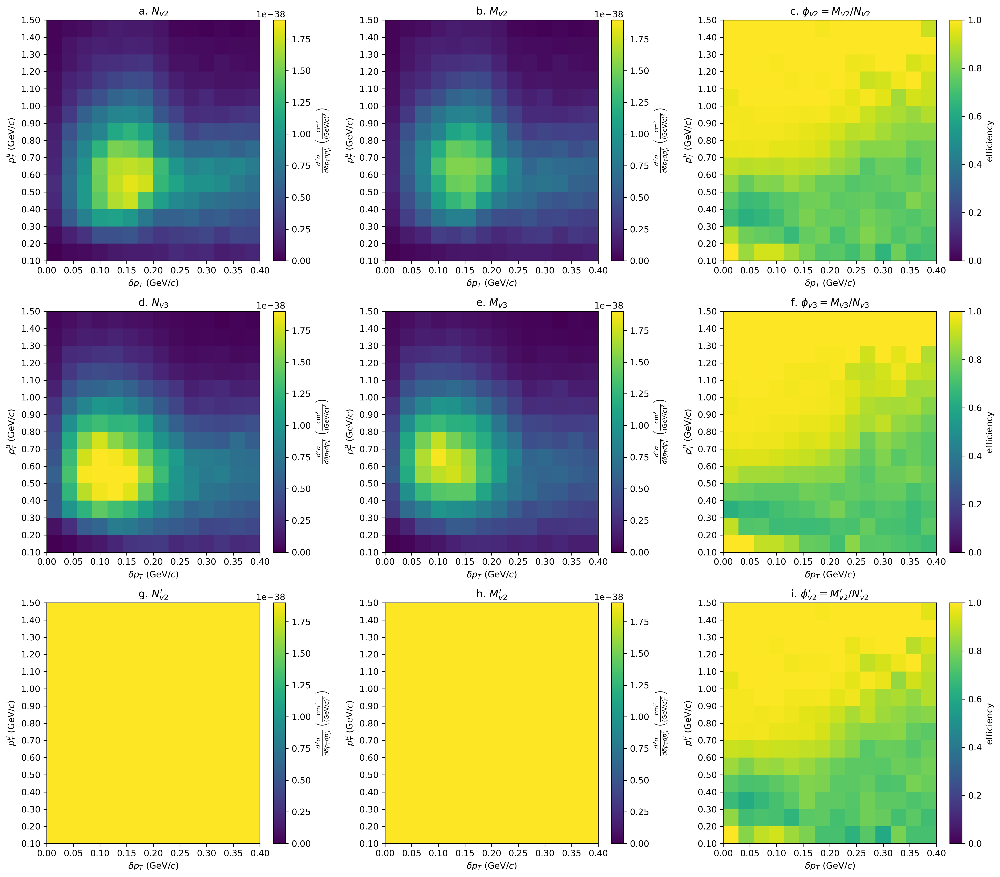

ValueError: 
\le ~ p^T_\mu ~ <
^
ParseFatalException: Unknown symbol: \le, found '\'  (at char 0), (line:1, col:1)

<Figure size 3000x2550 with 18 Axes>

In [73]:
draw_2Dxsec_and_efficiency(df_genie2=source_test_leading_proton,df_genie3=target_test_leading_proton,
     xybins=[
          np.linspace(0,0.4,15),
          np.linspace(0.1,1.5,15)
          ],
     Xsec_columns=('dpt','pT_muon'), xylabels=('$\delta p_T \ (\\text{GeV}/c)$','$p^\mu_T \ (\\text{GeV}/c)$'))



### Investigate high weight events: $w\in[0,10]$

/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:222: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


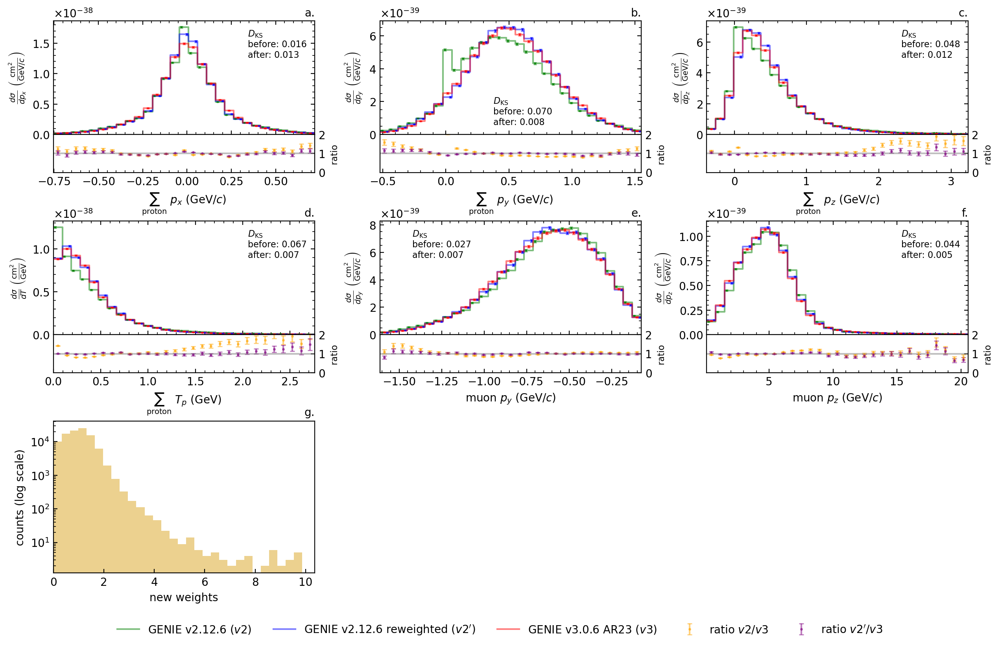

In [22]:
drawing_variables = [
    'total_proton_px','total_proton_py','total_proton_pz', 
    'total_proton_KE','leading_muon_py','leading_muon_pz',
    # 'Enu_true', 'Q2', 'q0', 'q3', 
    'weight'
]

source_test_all = pd.concat([
        source_test['0p0n'][drawing_variables], source_test['0pNn'][drawing_variables],
        source_test['1p0n'][drawing_variables], source_test['1pNn'][drawing_variables], source_test['2p0n'][drawing_variables],
        source_test['2pNn'][drawing_variables], source_test['others'][drawing_variables]
])

target_test_all = pd.concat([
        target_test['0p0n'][drawing_variables], target_test['0pNn'][drawing_variables],
        target_test['1p0n'][drawing_variables], target_test['1pNn'][drawing_variables], target_test['2p0n'][drawing_variables],
        target_test['2pNn'][drawing_variables], target_test['others'][drawing_variables]
])

weights_normalized = source_test_all['weight'] * len(source_test_all['weight'])/np.sum(source_test_all['weight'])
mask_source = weights_normalized <= 10

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test_all.loc[mask_source], target_test_all, 
    variables = drawing_variables,legends = legends,
    source_weights = np.ones(len(source_test_all.loc[mask_source])),
    target_weights = np.ones(len(target_test_all)), 
    new_source_weights = source_test_all.loc[mask_source]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

### Investigate high weight events: $w\in[0,5]$

/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:222: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


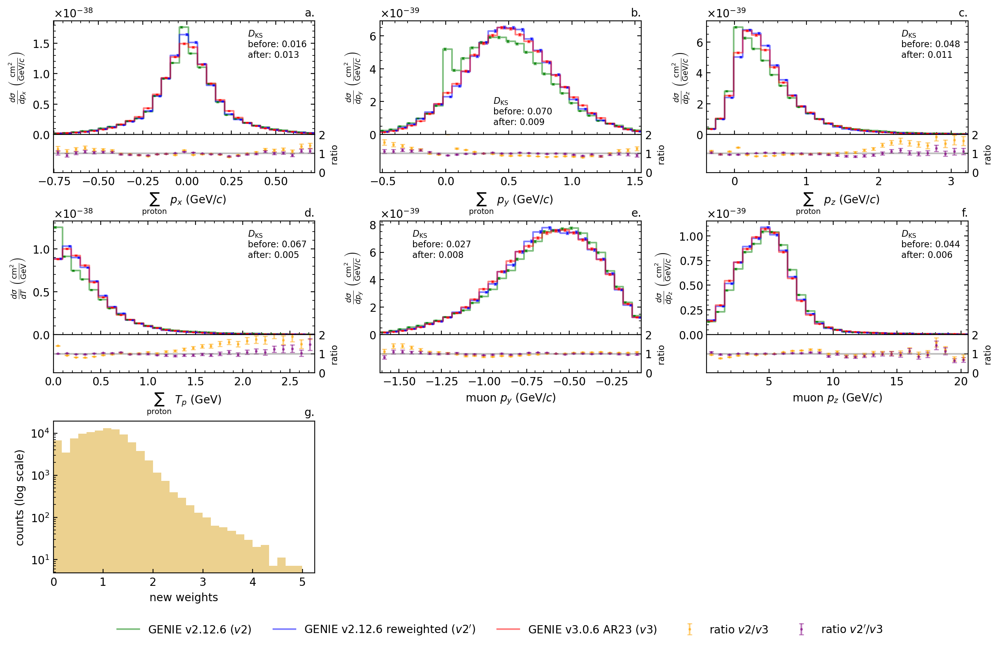

In [23]:
drawing_variables = [
    'total_proton_px','total_proton_py','total_proton_pz', 
    'total_proton_KE','leading_muon_py','leading_muon_pz',
    # 'Enu_true', 'Q2', 'q0', 'q3', 
    'weight'
]

source_test_all = pd.concat([
        source_test['0p0n'][drawing_variables], source_test['0pNn'][drawing_variables],
        source_test['1p0n'][drawing_variables], source_test['1pNn'][drawing_variables], source_test['2p0n'][drawing_variables],
        source_test['2pNn'][drawing_variables], source_test['others'][drawing_variables]
])

target_test_all = pd.concat([
        target_test['0p0n'][drawing_variables], target_test['0pNn'][drawing_variables],
        target_test['1p0n'][drawing_variables], target_test['1pNn'][drawing_variables], target_test['2p0n'][drawing_variables],
        target_test['2pNn'][drawing_variables], target_test['others'][drawing_variables]
])

weights_normalized = source_test_all['weight'] * len(source_test_all['weight'])/np.sum(source_test_all['weight'])
mask_source = weights_normalized <= 5

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test_all.loc[mask_source], target_test_all, 
    variables = drawing_variables,legends = legends,
    source_weights = np.ones(len(source_test_all.loc[mask_source])),
    target_weights = np.ones(len(target_test_all)), 
    new_source_weights = source_test_all.loc[mask_source]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

### Investigate high weight events: $w\in[0,3]$

/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:222: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


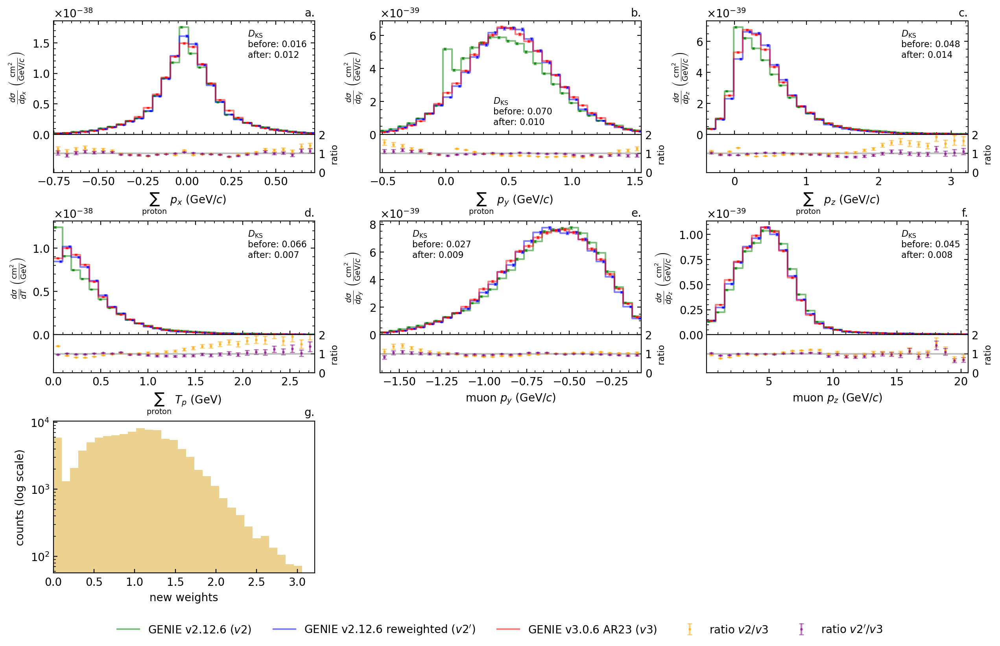

In [26]:
drawing_variables = [
    'total_proton_px','total_proton_py','total_proton_pz', 
    'total_proton_KE','leading_muon_py','leading_muon_pz',
    # 'Enu_true', 'Q2', 'q0', 'q3', 
    'weight'
]

source_test_all = pd.concat([
        source_test['0p0n'][drawing_variables], source_test['0pNn'][drawing_variables],
        source_test['1p0n'][drawing_variables], source_test['1pNn'][drawing_variables], source_test['2p0n'][drawing_variables],
        source_test['2pNn'][drawing_variables], source_test['others'][drawing_variables]
])

target_test_all = pd.concat([
        target_test['0p0n'][drawing_variables], target_test['0pNn'][drawing_variables],
        target_test['1p0n'][drawing_variables], target_test['1pNn'][drawing_variables], target_test['2p0n'][drawing_variables],
        target_test['2pNn'][drawing_variables], target_test['others'][drawing_variables]
])

weights_normalized = source_test_all['weight'] * len(source_test_all['weight'])/np.sum(source_test_all['weight'])
mask_source = weights_normalized <= 3

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test_all.loc[mask_source], target_test_all, 
    variables = drawing_variables,legends = legends,
    source_weights = np.ones(len(source_test_all.loc[mask_source])),
    target_weights = np.ones(len(target_test_all)), 
    new_source_weights = source_test_all.loc[mask_source]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

In [25]:
print('done')

done


### Alternative training scheme: single category, only muon kinematics
Category:
* CCQE 1mu, train on muon only

In [43]:
# Category name:
category = '1mu'

# Specify particle counts in final state:
particle_counts = {'muon':'==1'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz', 'leading_proton_KE',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
    'dpt', 'dalphat', 'dphit'
]

# Specify reweight training variables:
reweight_variables=[
    # 'leading_proton_px', 'leading_proton_py', 'leading_proton_pz',
    # 'total_proton_px', 'total_proton_py', 'total_proton_pz', 
    # 'total_proton_KE',
    'leading_muon_py','leading_muon_pz']

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['total_proton', 'leading_proton']

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 29.758 sec


/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:222: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


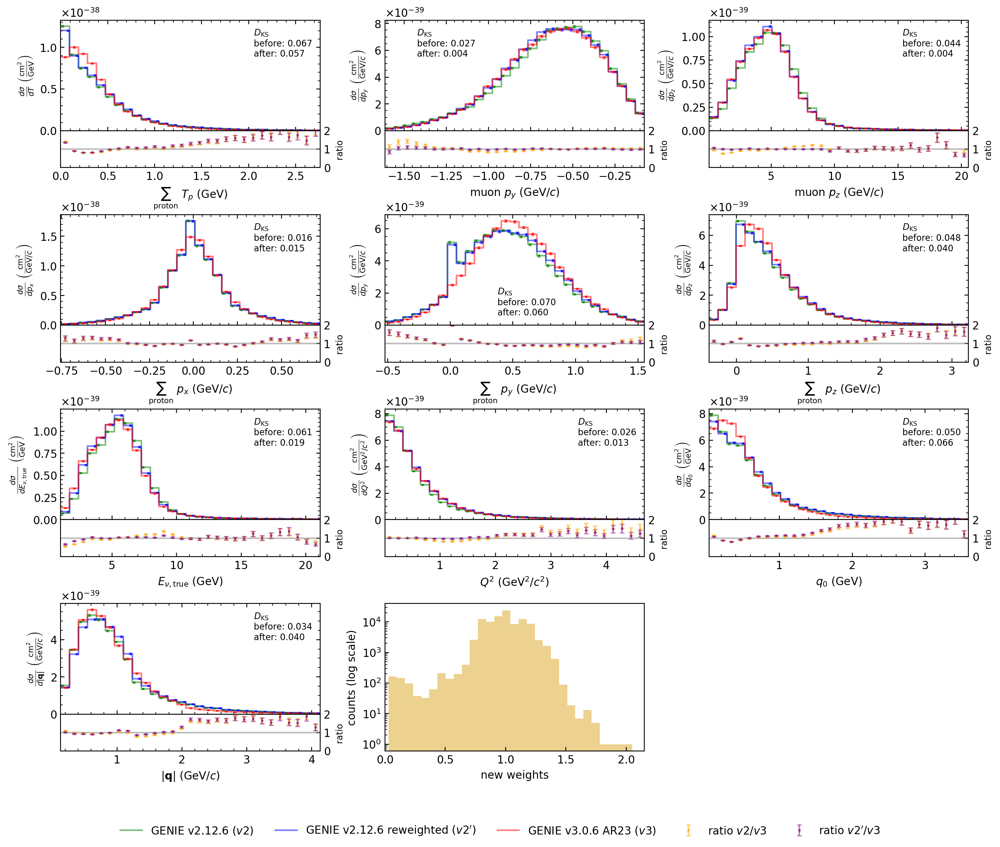

In [44]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = [
                     'total_proton_KE','leading_muon_py','leading_muon_pz', 
                    'total_proton_px','total_proton_py','total_proton_pz',
                    #  'leading_proton_px','leading_proton_py','leading_proton_pz',
                    #  'dpt', 'dalphat', 'dphit',
                    'Enu_true', 'Q2', 'q0', 'q3', 
                     'weight']

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables,legends=legends, label_subplot_abc=False,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# # Save reweighter to a path:
# reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


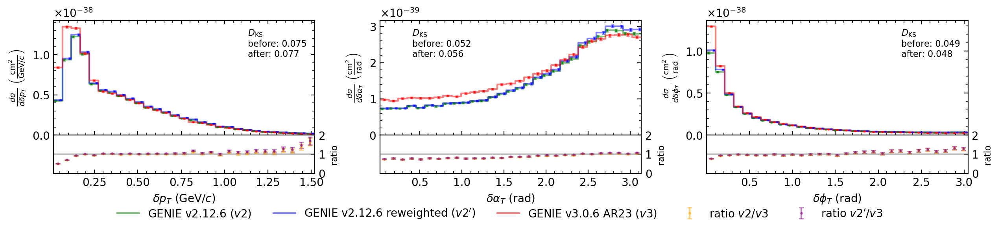

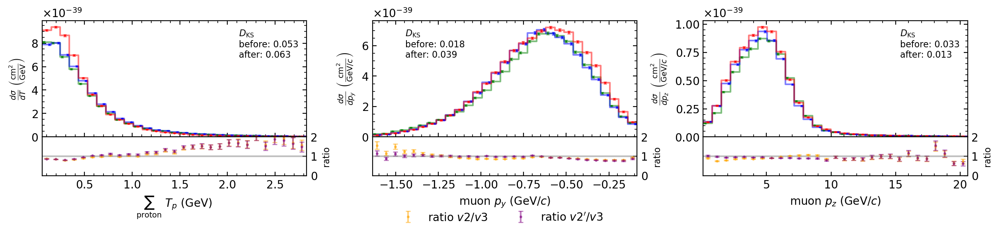

In [45]:
# plot TKI for those with a above-threshold leading proton
mask_source = source_test[category]['leading_proton_KE'] > 0.05
mask_target = target_test[category]['leading_proton_KE'] > 0.05
# mask_source = np.where(~np.isnan(source_test[category]['dalphat']))[0]
# mask_target = np.where(~np.isnan(target_test[category]['dalphat']))[0]

drawing_variables = [
                    # 'total_proton_px','total_proton_py','total_proton_pz',
                    #  'leading_proton_px','leading_proton_py','leading_proton_pz',
                    #  'total_proton_KE','leading_muon_py','leading_muon_pz', 
                     'dpt', 'dalphat', 'dphit',
                    #  'weight'
                     ]


# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category].loc[mask_source], target_test[category].loc[mask_target], 
    variables = drawing_variables, legends=legends, bottom_adjust=0.23, label_subplot_abc=False,
    source_weights = np.ones(len(source_test[category].loc[mask_source])),
    target_weights = np.ones(len(target_test[category].loc[mask_target])), 
    new_source_weights = source_test[category].loc[mask_source]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

drawing_variables = ['total_proton_KE','leading_muon_py','leading_muon_pz']

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category].loc[mask_source], target_test[category].loc[mask_target], 
    variables = drawing_variables, bottom_adjust=0.23, label_subplot_abc=False,
    source_weights = np.ones(len(source_test[category].loc[mask_source])),
    target_weights = np.ones(len(target_test[category].loc[mask_target])), 
    new_source_weights = source_test[category].loc[mask_source]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)
# # Save reweighter to a path:
# reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


### Alternative training scheme: single category, muon kinematics + sum(Tp)
Category:
* CCQE 1mu, train on muon and sum(Tp)

In [46]:
# Category name:
category = '1mu'

# Specify particle counts in final state:
particle_counts = {'muon':'==1'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz', 'leading_proton_KE',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
    'dpt', 'dalphat', 'dphit'
]

# Specify reweight training variables:
reweight_variables=[
    # 'leading_proton_px', 'leading_proton_py', 'leading_proton_pz',
    # 'total_proton_px', 'total_proton_py', 'total_proton_pz', 
    'total_proton_KE',
    'leading_muon_py','leading_muon_pz']

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['total_proton', 'leading_proton']

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 43.088 sec


/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:222: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


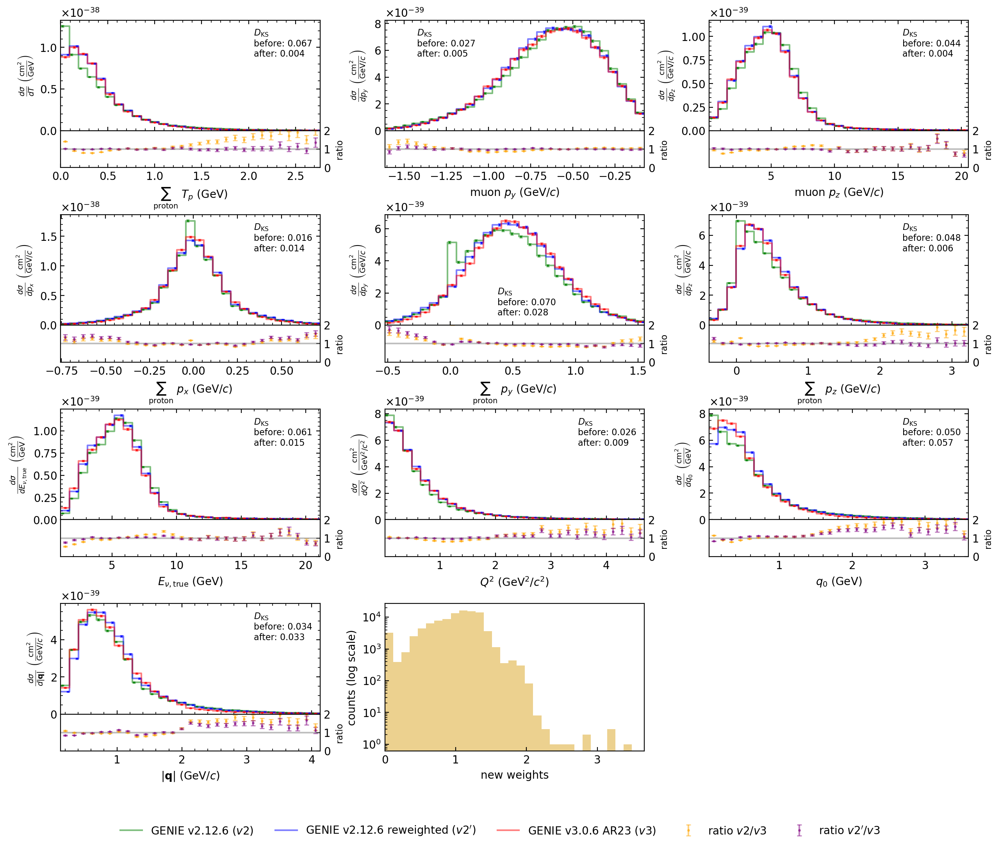

In [47]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = [
                    #  'leading_proton_px','leading_proton_py','leading_proton_pz',
                     'total_proton_KE','leading_muon_py','leading_muon_pz', 
                    'total_proton_px','total_proton_py','total_proton_pz',
                    #  'dpt', 'dalphat', 'dphit',
                    'Enu_true', 'Q2', 'q0', 'q3', 
                     'weight']

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables,legends=legends,label_subplot_abc=False,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# # Save reweighter to a path:
# reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


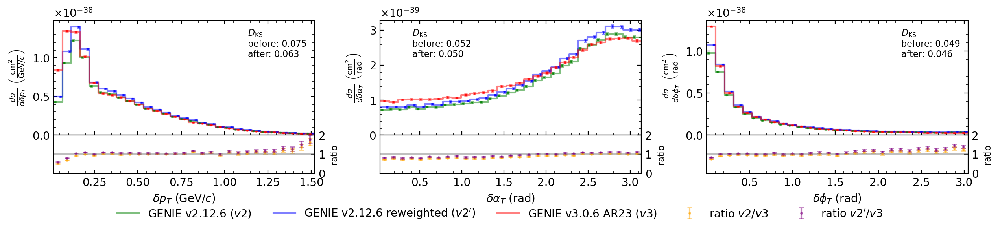

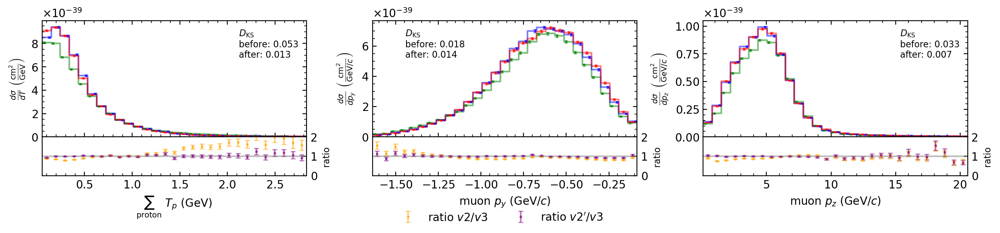

In [48]:
# plot TKI for those with a leading proton
mask_source = source_test[category]['leading_proton_KE'] > 0.05
mask_target = target_test[category]['leading_proton_KE'] > 0.05
# mask_source = np.where(~np.isnan(source_test[category]['dalphat']))[0]
# mask_target = np.where(~np.isnan(target_test[category]['dalphat']))[0]

drawing_variables = [
                    # 'total_proton_px','total_proton_py','total_proton_pz',
                    #  'leading_proton_px','leading_proton_py','leading_proton_pz',
                    #  'total_proton_KE','leading_muon_py','leading_muon_pz', 
                     'dpt', 'dalphat', 'dphit',
                    #  'weight'
                     ]


# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category].loc[mask_source], target_test[category].loc[mask_target], 
    variables = drawing_variables, legends=legends, bottom_adjust= 0.23, label_subplot_abc=False,
    source_weights = np.ones(len(source_test[category].loc[mask_source])),
    target_weights = np.ones(len(target_test[category].loc[mask_target])), 
    new_source_weights = source_test[category].loc[mask_source]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)
drawing_variables = ['total_proton_KE','leading_muon_py','leading_muon_pz']

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category].loc[mask_source], target_test[category].loc[mask_target], 
    variables = drawing_variables, bottom_adjust=0.23, label_subplot_abc=False,
    source_weights = np.ones(len(source_test[category].loc[mask_source])),
    target_weights = np.ones(len(target_test[category].loc[mask_target])), 
    new_source_weights = source_test[category].loc[mask_source]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)
# # Save reweighter to a path:
# reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


### Alternative training scheme: two categories, muon kinematics + sum(Tp)
Category:
* CCQE 1mu0p (no above threshold proton)
* CCQE 1muNp

In [49]:
# Category name:
category = '1mu0p'

# Specify particle counts in final state:
particle_counts = {'muon':'==1', 'proton':'==0'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz','leading_proton_KE',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
    'dpt', 'dalphat', 'dphit'
]

# Specify reweight training variables:
reweight_variables=[
    # 'leading_proton_px', 'leading_proton_py', 'leading_proton_pz',
    # 'total_proton_px', 'total_proton_py', 'total_proton_pz', 
    'total_proton_KE',
    'leading_muon_py','leading_muon_pz']

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['total_proton', 
                  'leading_proton'
                  ]

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 4.353 sec


/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:222: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


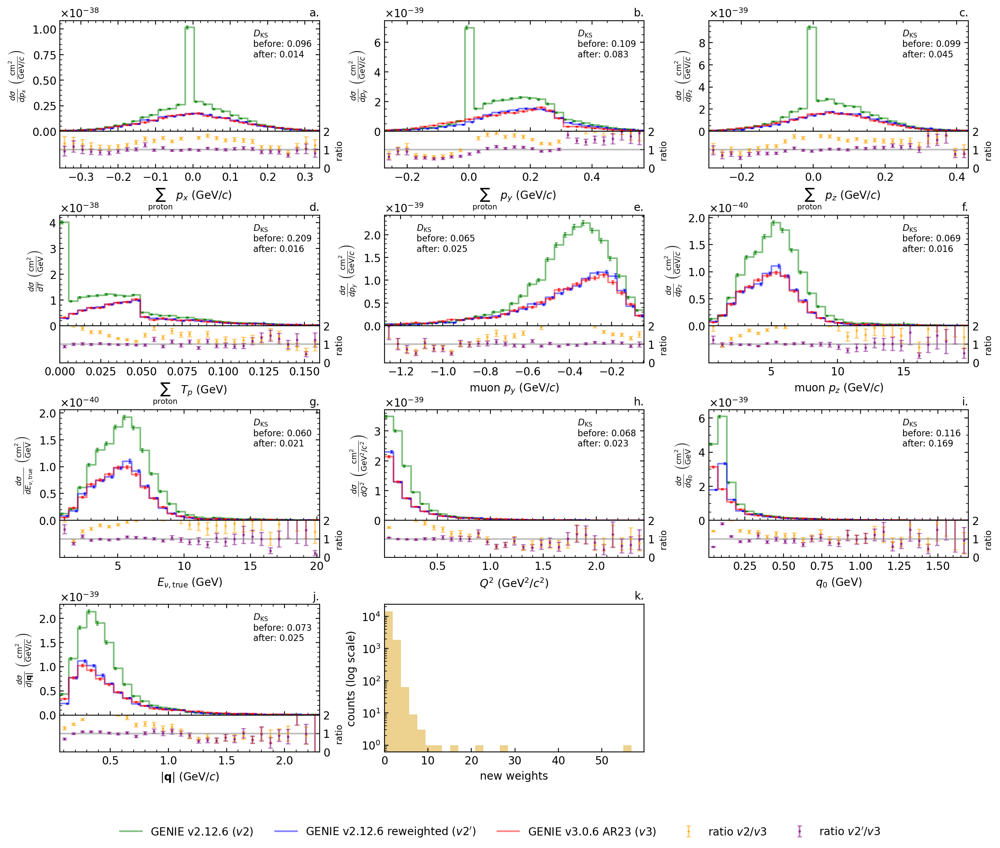

In [50]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = ['total_proton_px','total_proton_py','total_proton_pz',
                    #  'leading_proton_px','leading_proton_py','leading_proton_pz',
                     'total_proton_KE','leading_muon_py','leading_muon_pz', 
                    #  'dpt', 'dalphat', 'dphit',
                    'Enu_true', 'Q2', 'q0', 'q3', 
                     'weight']

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables, legends=legends,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# # Save reweighter to a path:
# reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


In [51]:
# Category name:
category = '1muNp'

# Specify particle counts in final state:
particle_counts = {'muon':'==1', 'proton':'>=1'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz','leading_proton_KE',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
    'dpt', 'dalphat', 'dphit'
]

# Specify reweight training variables:
reweight_variables=[
    # 'leading_proton_px', 'leading_proton_py', 'leading_proton_pz',
    # 'total_proton_px', 'total_proton_py', 'total_proton_pz', 
    'total_proton_KE',
    'leading_muon_py','leading_muon_pz']

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = ['total_proton', 
                  'leading_proton'
                  ]

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
# reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})
reweighter = Reweighter(n_estimators=200, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 74.932 sec


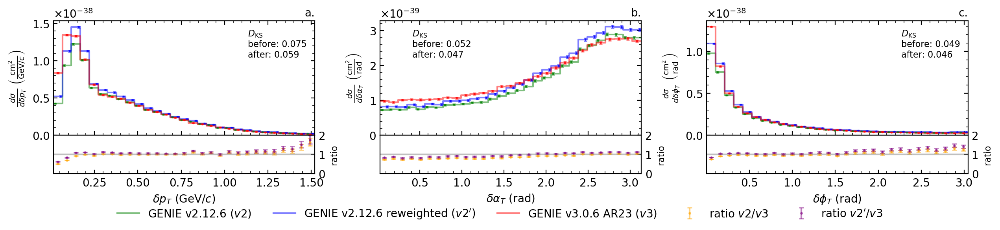

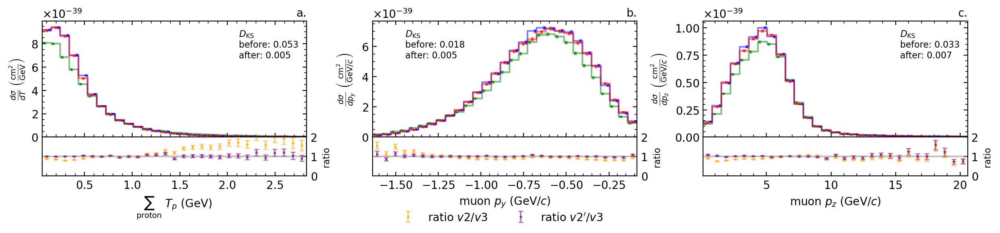

In [52]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = [
                    # 'total_proton_px','total_proton_py','total_proton_pz',
                    # 'leading_proton_px','leading_proton_py','leading_proton_pz',
                    # 'total_proton_KE','leading_muon_py','leading_muon_pz', 
                    'dpt', 'dalphat', 'dphit',
                    #  'weight'
                     ]

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables,legends=legends, bottom_adjust=0.23,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)
drawing_variables = [
                    'total_proton_KE','leading_muon_py','leading_muon_pz', 
                     ]
# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables,bottom_adjust=0.23,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# # Save reweighter to a path:
# reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


### combine two categories

/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:222: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


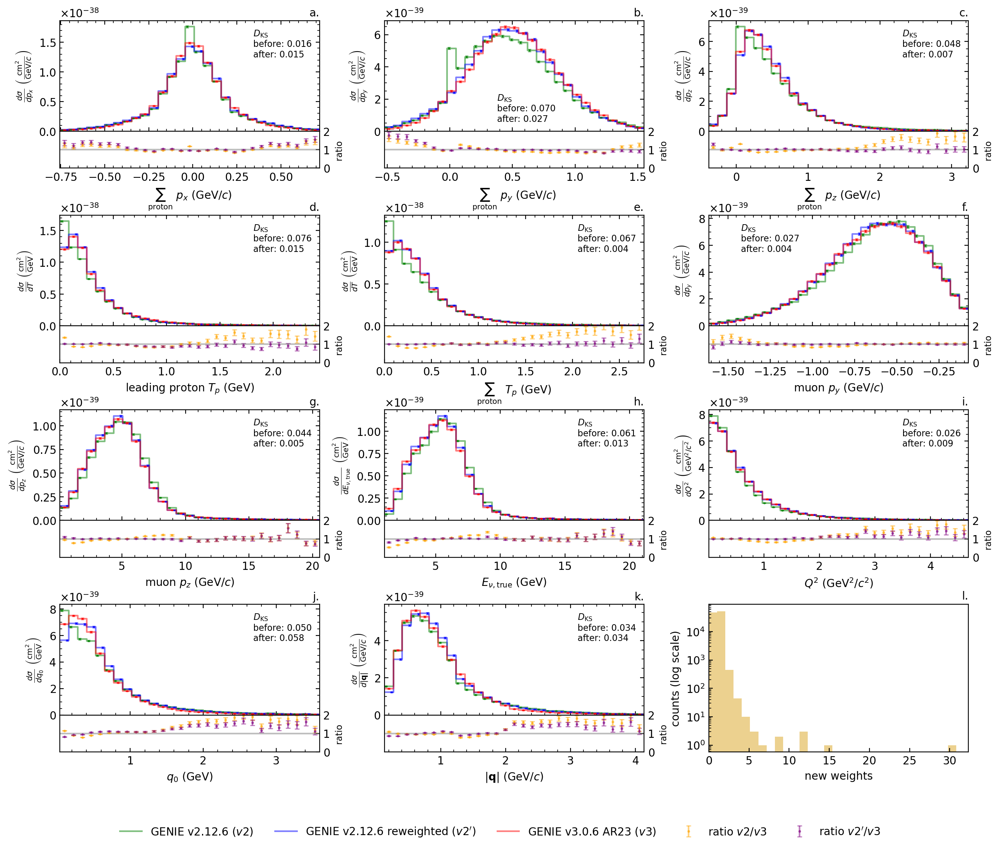

In [55]:
# All categories.
drawing_variables = [
                    'total_proton_px','total_proton_py','total_proton_pz','leading_proton_KE',
                     'leading_proton_px','leading_proton_py','leading_proton_pz',
                     'total_proton_KE','leading_muon_py','leading_muon_pz', 
                     'dpt', 'dalphat', 'dphit',
                     'Enu_true', 'Q2', 'q0', 'q3', 
                     'weight']

source_test_all = pd.concat([
        source_test['1mu0p'][drawing_variables], source_test['1muNp'][drawing_variables],
        # source_test['1p0n'][drawing_variables], source_test['1pNn'][drawing_variables], source_test['2p0n'][drawing_variables],
        # source_test['2pNn'][drawing_variables], source_test['others'][drawing_variables]
])

target_test_all = pd.concat([
        target_test['1mu0p'][drawing_variables], target_test['1muNp'][drawing_variables],
        # target_test['1p0n'][drawing_variables], target_test['1pNn'][drawing_variables], target_test['2p0n'][drawing_variables],
        # target_test['2pNn'][drawing_variables], target_test['others'][drawing_variables]
])
drawing_variables = [
                    'total_proton_px','total_proton_py','total_proton_pz','leading_proton_KE',
                    #  'leading_proton_px','leading_proton_py','leading_proton_pz',
                     'total_proton_KE','leading_muon_py','leading_muon_pz', 
                    #  'dpt', 'dalphat', 'dphit',
                    'Enu_true', 'Q2', 'q0', 'q3', 
                     'weight']

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test_all, target_test_all, 
    variables = drawing_variables,legends=legends,
    source_weights = np.ones(len(source_test_all)),
    target_weights = np.ones(len(target_test_all)), 
    new_source_weights = source_test_all['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)


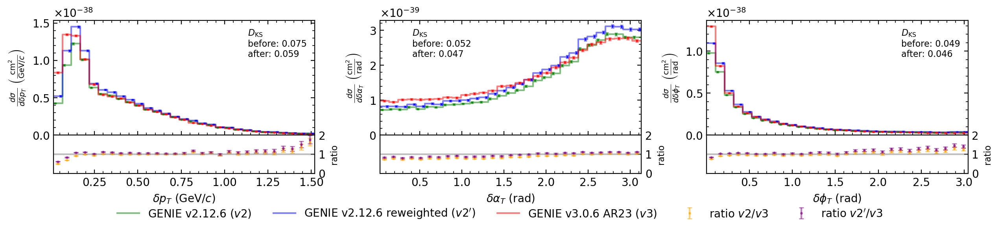

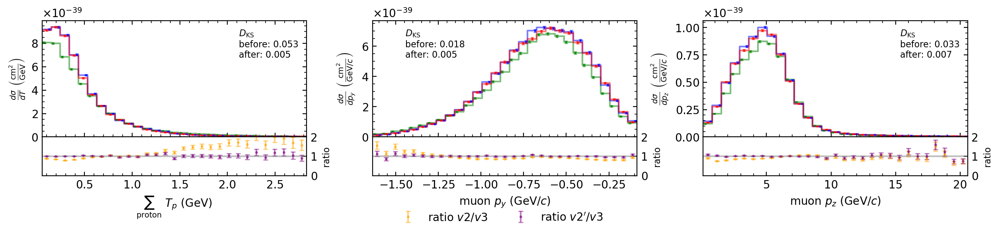

In [56]:
# plot TKI for those with a leading proton
drawing_variables = [
                    # 'total_proton_px','total_proton_py','total_proton_pz',
                    #  'leading_proton_px','leading_proton_py','leading_proton_pz',
                    #  'total_proton_KE','leading_muon_py','leading_muon_pz', 
                     'dpt', 'dalphat', 'dphit',
                    #  'weight'
                     ]
mask_source = source_test_all['leading_proton_KE'] > 0.05
mask_target = target_test_all['leading_proton_KE'] > 0.05
# mask_source = np.where(~np.isnan(source_test_all['dalphat']))[0]
# mask_target = np.where(~np.isnan(target_test_all['dalphat']))[0]

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test_all.loc[mask_source], target_test_all.loc[mask_target], 
    variables = drawing_variables,legends=legends, bottom_adjust=0.23, label_subplot_abc=False,
    source_weights = np.ones(len(source_test_all.loc[mask_source])),
    target_weights = np.ones(len(target_test_all.loc[mask_target])), 
    new_source_weights = source_test_all.loc[mask_source]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

drawing_variables = ['total_proton_KE','leading_muon_py','leading_muon_pz']

draw_source_target_distributions_and_ratio(source_test_all.loc[mask_source], target_test_all.loc[mask_target], 
    variables = drawing_variables, bottom_adjust=0.23, label_subplot_abc=False,
    source_weights = np.ones(len(source_test_all.loc[mask_source])),
    target_weights = np.ones(len(target_test_all.loc[mask_target])), 
    new_source_weights = source_test_all.loc[mask_source]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

### Alternative training scheme, now include proton momenta
* 1mu0p, train on muon kinematics, sum(Tp)
* 1muNp, train on muon and proton kinematics kinematics, sum(Tp)

In [57]:
# Category name:
category = '1muNp'

# Specify particle counts in final state:
particle_counts = {'muon':'==1', 'proton':'>=1'}

# List variables to extract from tree:
variable_exprs = [
    'Enu_true', 'Q2', 'q0', 'q3', 'W',
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz','leading_proton_KE',
    'leading_muon_px', 'leading_muon_py', 'leading_muon_pz', 'leading_muon_KE',
    'total_proton_px', 'total_proton_py', 'total_proton_pz', 'total_proton_KE',
    'dpt', 'dalphat', 'dphit'
]

# Specify reweight training variables:
reweight_variables=[
    'leading_proton_px', 'leading_proton_py', 'leading_proton_pz',
    # 'total_proton_px', 'total_proton_py', 'total_proton_pz', 
    'total_proton_KE',
    'leading_muon_py','leading_muon_pz']

# Specify selector_particle's whose momentum are transformed to reaction frame:
# (leading muon px py pz is assumed to be transformed)
particle_names = [
                'total_proton', 
                'leading_proton'
                  ]

# Create a mask for the topology and create dataframes:
mask = tree_source_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_train[category] = create_dataframe_from_nuisance(tree_source_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_train.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_train[category] = create_dataframe_from_nuisance(tree_target_train, variable_exprs=variable_exprs, mask=mask)

mask = tree_source_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
source_test[category] = create_dataframe_from_nuisance(tree_source_test, variable_exprs=variable_exprs, mask=mask)

mask = tree_target_test.get_mask_topology(particle_counts = particle_counts, KE_thresholds = KE_thresholds)
target_test[category] = create_dataframe_from_nuisance(tree_target_test, variable_exprs=variable_exprs, mask=mask)


# Convert to reaction frame:
source_train[category] = transform_momentum_to_reaction_frame(source_train[category], selector_lepton='leading_muon', particle_names=particle_names)
target_train[category] = transform_momentum_to_reaction_frame(target_train[category], selector_lepton='leading_muon', particle_names=particle_names)
source_test[category] = transform_momentum_to_reaction_frame(source_test[category], selector_lepton='leading_muon', particle_names=particle_names)
target_test[category] = transform_momentum_to_reaction_frame(target_test[category], selector_lepton='leading_muon', particle_names=particle_names)


# Create a Reweighter (inherited from hep_ml.reweight.GBReweighter) instance: 
reweighter = Reweighter(n_estimators=100, learning_rate=0.1, max_depth=4, min_samples_leaf=30, gb_args={'subsample': 1.0})
# reweighter = Reweighter(n_estimators=300, learning_rate=0.1, max_depth=6, min_samples_leaf=20, gb_args={'subsample': 1.0})

# Traing reweighter using source and target sample's reweight variables:
start_time = time.perf_counter()
reweighter.fit(source_train[category][reweight_variables], target_train[category][reweight_variables])
end_time = time.perf_counter()
print(f'Elapsed time: {(end_time-start_time):.3f} sec')


Elapsed time: 73.381 sec


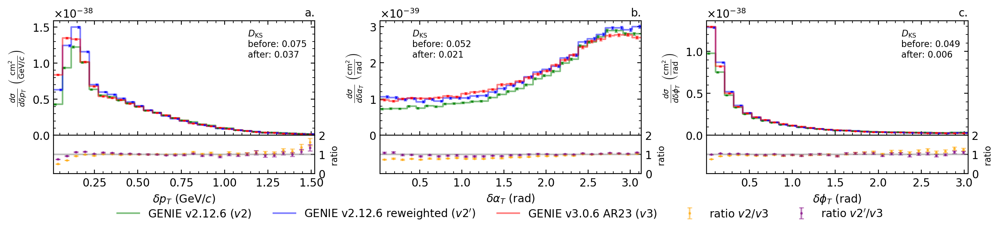

In [58]:
# Set target weights to 1.0 for all events:
target_test[category]['weight'] = 1.0

# Specify variables to be plotted as histograms:
drawing_variables = [
                    # 'total_proton_px','total_proton_py','total_proton_pz',
                    # 'leading_proton_px','leading_proton_py','leading_proton_pz',
                    # 'total_proton_KE','leading_muon_py','leading_muon_pz', 
                    'dpt', 'dalphat', 'dphit',
                    #  'weight'
                     ]

# Predict weights for source model:
source_test[category]['weight'] = reweighter.predict_matched_total_weights(
    source_test[category][reweight_variables], 
    original_weight=None,
    target_weight=target_test[category]['weight']
)

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test[category], target_test[category], 
    variables = drawing_variables,legends=legends, bottom_adjust=0.23,
    source_weights = np.ones(len(source_test[category])),
    target_weights = np.ones(len(target_test[category])), 
    new_source_weights = source_test[category]['weight'],
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

# # Save reweighter to a path:
# reweighter.save_to_pickle(f'/exp/minerva/data/users/zihaolin/BDTReweighters/saved_reweighters_pickle/reweighter_MINERvA_ME_numuCarbon_CCQELike_GENIEv2_to_v3AR23_1mu{category}.pkl')


### Combine two categories

/exp/minerva/app/users/zihaolin/REWEIGHTworkdir/BDTReweight/analysis.py:222: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax_main.set_ylim(0, None)


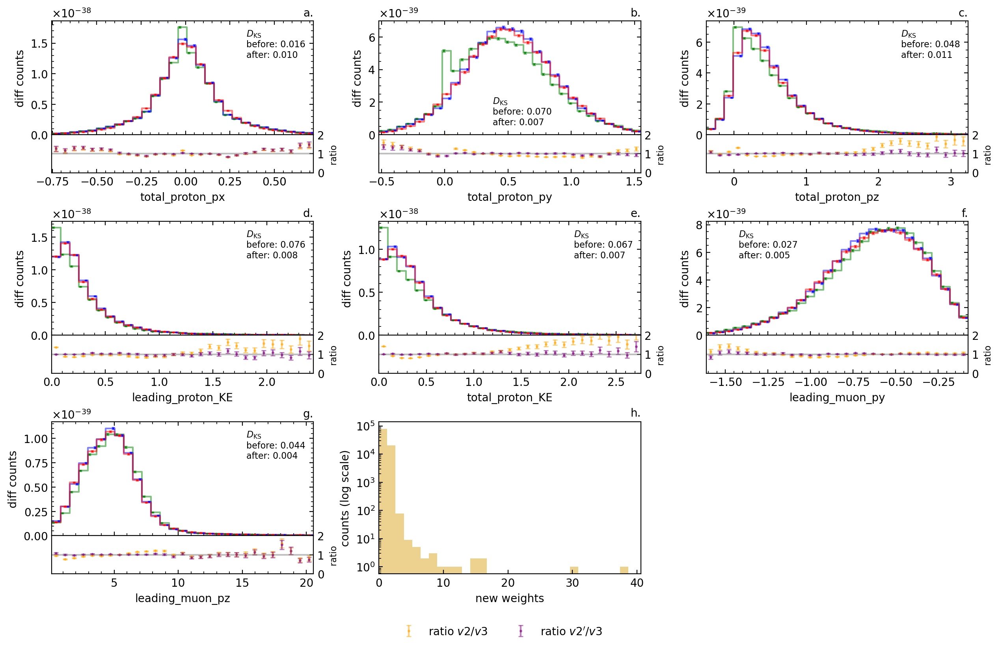

In [59]:
# combine categories.
drawing_variables = [
                    'total_proton_px','total_proton_py','total_proton_pz','leading_proton_KE',
                     'leading_proton_px','leading_proton_py','leading_proton_pz',
                     'total_proton_KE','leading_muon_py','leading_muon_pz', 
                     'dpt', 'dalphat', 'dphit',
                     'weight']

source_test_all = pd.concat([
        source_test['1mu0p'][drawing_variables], source_test['1muNp'][drawing_variables],
        # source_test['1p0n'][drawing_variables], source_test['1pNn'][drawing_variables], source_test['2p0n'][drawing_variables],
        # source_test['2pNn'][drawing_variables], source_test['others'][drawing_variables]
])

target_test_all = pd.concat([
        target_test['1mu0p'][drawing_variables], target_test['1muNp'][drawing_variables],
        # target_test['1p0n'][drawing_variables], target_test['1pNn'][drawing_variables], target_test['2p0n'][drawing_variables],
        # target_test['2pNn'][drawing_variables], target_test['others'][drawing_variables]
])
drawing_variables = [
                    'total_proton_px','total_proton_py','total_proton_pz','leading_proton_KE',
                    #  'leading_proton_px','leading_proton_py','leading_proton_pz',
                     'total_proton_KE','leading_muon_py','leading_muon_pz', 
                    #  'dpt', 'dalphat', 'dphit',
                     'weight']

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test_all, target_test_all, 
    variables = drawing_variables,
    source_weights = np.ones(len(source_test_all)),
    target_weights = np.ones(len(target_test_all)), 
    new_source_weights = source_test_all['weight'],
    # xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    # ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)


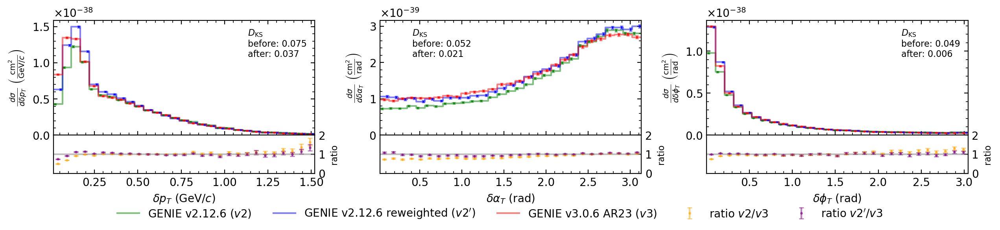

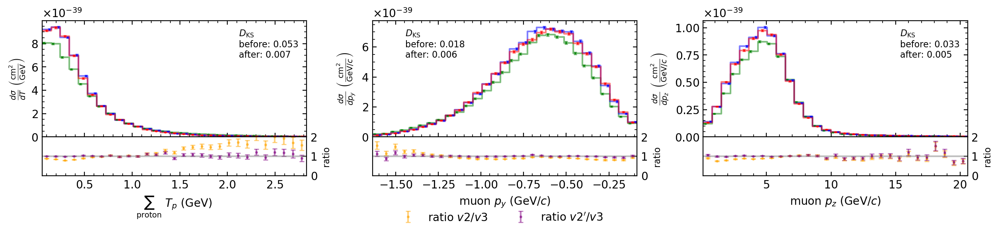

In [60]:
# plot TKI for those with a leading proton
drawing_variables = [
                    # 'total_proton_px','total_proton_py','total_proton_pz',
                    #  'leading_proton_px','leading_proton_py','leading_proton_pz',
                    #  'total_proton_KE','leading_muon_py','leading_muon_pz', 
                     'dpt', 'dalphat', 'dphit',
                    #  'weight'
                     ]
mask_source = source_test_all['leading_proton_KE'] > 0.05
mask_target = target_test_all['leading_proton_KE'] > 0.05

# mask_source = np.where(~np.isnan(source_test_all['dalphat']))[0]
# mask_target = np.where(~np.isnan(target_test_all['dalphat']))[0]

# Draw distribution histograms:
draw_source_target_distributions_and_ratio(source_test_all.loc[mask_source], target_test_all.loc[mask_target], 
    variables = drawing_variables,legends=legends, bottom_adjust=0.23, label_subplot_abc=False,
    source_weights = np.ones(len(source_test_all.loc[mask_source])),
    target_weights = np.ones(len(target_test_all.loc[mask_target])), 
    new_source_weights = source_test_all.loc[mask_source]['weight']*np.sum(target_test_all.loc[mask_target]['weight'])/np.sum(source_test_all.loc[mask_source]['weight']),
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

drawing_variables = ['total_proton_KE','leading_muon_py','leading_muon_pz']

draw_source_target_distributions_and_ratio(source_test_all.loc[mask_source], target_test_all.loc[mask_target], 
    variables = drawing_variables,bottom_adjust=0.23, label_subplot_abc=False,
    source_weights = np.ones(len(source_test_all.loc[mask_source])),
    target_weights = np.ones(len(target_test_all.loc[mask_target])), 
    new_source_weights = source_test_all.loc[mask_source]['weight']*np.sum(target_test_all.loc[mask_target]['weight'])/np.sum(source_test_all.loc[mask_source]['weight']),
    xlabels = [particle_variable_to_latex(var) for var in drawing_variables],
    ylabels = [diff_xsec_latex_wrt_variable(var) for var in drawing_variables],
    scale_source = scale_source_test, scale_target = scale_target_test
)

### The large weight events
Let's look at the high weight events